In [1]:
import numpy as np
# pandas is a fast and simple library for data manipulation
# it supports spreadsheet-like data structures, so we can read/write/manipulate csv or excel files easily
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
# use curve_fit for Rosenbluth linear fit
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# import subprocess
# python version: /usr/local/bin/python3
# optional: use science paper style for plots
# from matplotlib.ticker import ScalarFormatter



# import scienceplots
# plt.style.use('science')



from PIL import Image
from reportlab.pdfgen import canvas
# plt.rcParams['font.weight'] = 'bold'  # Applies to all text elements
# plt.rcParams['axes.titleweight'] = 'bold'  # Bold titles
# plt.rcParams['axes.labelweight'] = 'bold'  # Bold axis labels
# plt.rcParams['legend.fontsize'] = 12  # Adjust legend font size
# plt.rcParams['legend.fontweight'] = 'bold'  # Bold legend text
# plt.rcParams['xtick.labelsize'] = 12  # Adjust x-tick labels font size
# plt.rcParams['ytick.labelsize'] = 12  # Adjust y-tick labels font size

# calculate bin-centering correction using Fortran program
import subprocess
import os



In [2]:
#____________________presets____________________
# physical constants
mass_nucleon = 0.938273
mass_C12=11.178
alpha_fine = 1/137.036

# three-momentum bin centers
qvcenters = [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649, 0.756, 0.991, 1.619, 1.921, 2.213, 2.500, 2.783, 3.500]
# three-momentum edges
qvbins = [0.063, 0.124, 0.158, 0.186, 0.223, 0.270, 0.340, 0.428, 0.523, 0.609, 0.702, 0.878, 1.302, 1.770, 2.067, 2.357, 2.642, 2.923, 4.500]
# four-momentum squared bin names, in string format
qvbin_names = ['[0.063,0.124]', '[0.124,0.158]', '[0.158,0.186]', '[0.186,0.223]', '[0.223,0.270]', '[0.270,0.340]', '[0.340,0.428]', '[0.428,0.523]', '[0.523,0.609]',
                '[0.609,0.702]', '[0.702,0.878]', '[0.878,1.302]', '[1.302,1.770]', '[1.770,2.067]', '[2.067,2.357]', '[2.357,2.642]', '[2.642,2.923]', '[2.923,4.500]']

# four-momentum squared bin centers
Q2centers = [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380, 0.500, 0.800, 1.250, 1.750, 2.250, 2.750, 3.250, 3.750]
# four-momentum squared bin edges
Q2bins = [0.004, 0.015, 0.025, 0.035, 0.045, 0.070, 0.100, 0.145, 0.206, 0.322, 0.438, 0.650, 1.050, 1.500, 2.000, 2.500, 3.000, 3.500, 4.000]
# four-momentum squared bin names, in string format
Q2bin_names = ['[0.004,0.015]', '[0.015,0.025]', '[0.025,0.035]', '[0.035,0.045]', '[0.045,0.070]', '[0.070,0.100]', '[0.100,0.145]', '[0.145,0.206]', '[0.206,0.322]',
                '[0.322,0.438]', '[0.438,0.650]', '[0.650,1.050]', '[1.050,1.500]', '[1.500,2.000]', '[2.000,2.500]', '[2.500,3.000]', '[3.000,3.500]', '[3.500,4.000]']

# Feb24 2025: map from data set index to data set name (author, year, etc.)
dataSet_to_name = {1:"Barreau:1983ht", 2:"O'Connell:198", 3:"Sealock:1989nx", 4:"Baran:1988tw", 5:"Bagdasaryan:1988hp", 6:"Dai - HallA:2019da", 
    7:"Arrington:1995hs", 8:"Day:1993md", 9:"Arrington:1998psnoCC", 10:"Gaskell:2008", 11:"Whitney:1974hr", 12:"AlsamiJan05", 13:"VaheJun07", 
    14:"Gomez74", 15:"Fomin", 16:"Yamaguchi73", 17:"Ryan84", 18:"Cyzyk:1963zz", 19:"Bounin63", 20:"Photo-Daphne", 
    # 21:"Spamer70", 
    21:"Antony-Spies:1970jjs",22:"Goldemberg64", 23:"DeForrest65", 24:"Mihovilovic:2024ymj", 25:"CLAS-e4nu",26:"GarinoBates:1992"}

# march 31 from Eric:
dataSet_to_normalization = {
    1: 0.95971, 2: 0.96416, 3: 1.0744, 4: 0.99482, 5: 0.93381,
    6: 1.0126, 7: 0.96716, 8: 1.0238, 9: 0.97904, 10: 0.99064,
    11: 0.98384, 12: 1.0000, 13: 1.0163, 14: 1.0300, 15: 1.0190,
    16: 0.95853, 17: 1.0174, 18: 1.0168, 19: 1.0794, 20: 1.0000,
    21: 1.0019, 22: 0.99801, 23: 0.96773, 24: 0.95610,
    25:0.85, 26:0.94
}

dataSet_to_normError = {
    1: 0.62926E-02, 2: 0.12908E-01, 3: 0.80983E-02, 4: 0.69809E-02, 5: 0.16758E-01,
    6: 0.92261E-02, 7: 0.15546E-01, 8: 0.65203E-02, 9: 0.55606E-02, 10: 0.75245E-02,
    11: 0.25318E-01, 12: 0.0, 13: 0.17632E-02, 14: 0.91993E-02, 15: 0.63181E-02,
    16: 0.25582E-01, 17: 0.42184E-01, 18: 0.68067E-01, 19: 0.35847E-01, 20: 0.0,
    21: 0.18356E-01, 22: 0.41475E-01, 23: 0.17317E-01, 24: 0.23120E-01,
    25:0.02,26:0.02
}

# ____________________utility functions____________________

# round to only 3 significant figures (for printing)
def round_sig_3(x):
    return '%s' % float('%.3g' % x)

# append a row to a dataframe
def append_row(df, row):
    return pd.concat([df, pd.DataFrame([row], columns=row.index)]).reset_index(drop=True)

# linear model for Rosenbluth fitting
def linear_model(x, a, b):
    return a * x + b

def Vcoul(A=12,Z=6):
    HBARC  = 0.197327      # in GeV.fm
    ALPHA  = 1.0/137.0
    C_ASTE = 0.775
    R0     = 1.1*A**(1./3.) + 0.86*A**(-1./3.)

    # Coulomb potential at the center of the nucleus
    V0  = (3./2.)*ALPHA*HBARC*(Z-1.)/R0  # in GeV

    # Average potential
    V  = C_ASTE*V0      # from Eur. Phys. J. A26 (2005) 167
    return V

def quasi_deuteron(ex): # ex in MeV; return GD cross-section: GeV^-2
    def pauli_blocking(ex): # ex in MeV
        if ex <=20:
            return np.exp(-73.3/ex)
        elif 20 < ex <=140: 
            return 8.3714e-2 - 9.8343e-3 * ex + 4.1222e-4 * ex**2 - 3.4762e-6 * ex**3 + 9.3537e-9 * ex**4
        else:
            return np.exp(-24.2/ex)
    N=6
    A=12
    Z=6
    if ex <2.224:
        return 0
    else:    
        sigma = 397.8*(N*Z/A)*((ex-2.224)**(3/2))*(ex**-3)*pauli_blocking(ex) # in mb
        return sigma * 0.1 * 0.1975**-2 # in GeV^-2

def dipole_E(Q2): # Q2 in GeV^2; return dipole form unitless
    return 1/((1+Q2/0.71)**2)


In [3]:
# ____________________RLRT extraction, plotting functions____________________
errorbar_setting = {'markersize':0,'capsize':0,'lw':1,'fmt':'D','elinewidth':1,'zorder':2,'alpha':1}
our_scatter_setting = {'s':7,'marker':'D','edgecolors':'black','linewidth':0.5,'zorder':4,'alpha':1}
scatter_setting = {'s':7,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}
photo_scatter_setting = {'s':50,'color':'lime','marker':'^','edgecolors':'black','linewidth':0.5,'zorder':1}

Ex_cut=0.03
Ex_cut_lowq=0.1

def prepare_df(df_data=None,coulomb=None):
    df = df_data.copy()
    # read the csv file:
    # if filepath is not None:
    #     df = pd.read_csv(filepath)
    #     # Z,A,E0,ThetaDeg,nu,cross,error,dataSet
    #     df = df[['Z','A','E0','ThetaDeg','nu','cross','error','dataSet']]
    # elif df_data is not None:
    #     df = df_data.copy()
    # else:
    #     return None

    if 'error' not in df.columns:
        df['error']=0.0

    # calculate normalized cross section:
    if 'dataSet' not in df.columns:
        df['dataSet']=-1
        df['normalization']=1
        df['normError']=0
    else:
        df["normalization"]=df["dataSet"].map(dataSet_to_normalization)
        df["normError"]=df["dataSet"].map(dataSet_to_normError)
    df['normCross'] = df['cross'] * df['normalization']
        
    # system_err = 0.02
    system_err = 0.0

    df['error'] = np.sqrt(df['error']**2 + ((system_err*df['cross'])**2))
    df['normCrossError']=df['normCross']*np.sqrt((df['error']/df['cross'])**2+(df['normError']/df['normalization'])**2)
    df["ThetaRad"]=df["ThetaDeg"]*np.pi/180
    df["sin2(T/2)"]=(np.sin(df["ThetaRad"]/2))**2
    df["cos2(T/2)"]=(np.cos(df["ThetaRad"]/2))**2
    df["tan2(T/2)"]=(np.tan(df["ThetaRad"]/2))**2

    df["Ex"] = df["nu"] - (df["E0"]-df["E0"]/(1+2*df["E0"]*df["sin2(T/2)"]/mass_C12))

    # R = 2.894, Z = 6, A = 12
    # df["R"]=1.1*(df["A"])**(1/3)+0.86/((df["A"])**(1/3))
    
    df["Ep"]=df["E0"]-df["nu"]

    
    if coulomb is not None:
        df["Veff"]=coulomb
    else:
        df["Veff"]=Vcoul(A=12,Z=6)

    # GENIE:
    # df["Veff"]=0.0
    
    df["Ffoc2"]=((df["E0"]+df["Veff"])/df["E0"])**2
    
    # starting here: effective values only______________________
    df["E0original"]=df["E0"]
    df["E0"]=df["E0"]+df["Veff"]
    df["Ep"]=df["Ep"]+df["Veff"]

    df["Q2"]=4*df["E0"]*(df["Ep"])*df["sin2(T/2)"]
    # df["Q2eff"]=4*df["E0eff"]*df["Epeff"]*df["sin2(T/2)"]
    df["qv2"]=df["nu"]**2+df["Q2"]
    df["qv"]=np.sqrt(df["qv2"])

    df["W2"]=mass_nucleon**2+2*mass_nucleon*df["nu"]-df["Q2"]

    # !!!! question June 11
    # df = df.loc[df['W2']>=0]# interesting

    # df["WA2"]=mass_C12**2+2*mass_C12*df["nu"]-df["Q2"]
    df["epsilon"]=1/(1+2*(1+(df["nu"]**2)/df["Q2"])*df["tan2(T/2)"]) 


    df["gamma"]=alpha_fine*df["Ep"]*(df["W2"]-mass_nucleon**2)/((4*((np.pi)**2)*df["Q2"]*mass_nucleon*df["E0"])*(1-df["epsilon"]))
    df["Sig_R"]=df["normCross"]/df["gamma"]
    df["D_sig_R"]=df["error"]/df["gamma"]
    df["Sig_mott"]=4*(alpha_fine**2)*(df["Ep"]**2)*df["cos2(T/2)"]/(df["Q2"]**2)
    df["Sig_mott"]=df["Ffoc2"]*alpha_fine**2 *df["cos2(T/2)"]*(2*df["E0"]*df["sin2(T/2)"])**-2

    # Calculate the Rosenbluth quantity:
    df["Hcc"]= ((df["qv"]**4)/(4*(alpha_fine**2)*(df["Ep"]**2)*(df["cos2(T/2)"]+2*(df["qv2"]/df["Q2"])*df["sin2(T/2)"])))/df["Ffoc2"]
    df["Hcc_Sig(nb)"]=df["Hcc"]*df["normCross"]
    df["Hcc_error(nb)"]=df["Hcc"]*df["normCrossError"]
    df["Hcc_Sig(GeV)"]=df["Hcc_Sig(nb)"]/((0.1973269**2)*10000000)
    df["Hcc_error(GeV)"]=df["Hcc_error(nb)"]/((0.1973269**2)*10000000)

    # # subdivide the data into bins
    df['qvbin'] = 0
    df['qvcenter'] = 0
    df["qvbin"]=pd.cut(x=df["qv"],bins=qvbins,labels=qvbin_names,right=True)
    df["qvcenter"]=pd.cut(x=df["qv"],bins=qvbins,labels=qvcenters,right=True)
    df['qvcenter']=pd.to_numeric(df['qvcenter'])

    df['Q2bin'] = 0
    df['Q2center'] = 0
    df["Q2bin"]=pd.cut(x=df["Q2"],bins=Q2bins,labels=Q2bin_names,right=True)
    df["Q2center"]=pd.cut(x=df["Q2"],bins=Q2bins,labels=Q2centers,right=True)
    df['Q2center']=pd.to_numeric(df['Q2center'])
    df=df.dropna()

    # W2binsizes = np.array([0.01,0.01,0.01,0.01,0.01,
    #                        0.01,0.01,0.015,0.015,0.05,
    #                        0.1,0.1,0.1,0.1,0.1,
    #                        0.1,0.1,0.1])
    # Exbinsizes = np.array([0.01,0.01,0.01,0.01,0.01,
    #                     0.02,0.02,0.02,0.02,0.02,
    #                     0.02,0.02,0.02,0.02,0.02,
    #                     0.02,0.02,0.02])
    ## bin-centering related:
    df['W2bin_q2']=0.0
    df['W2center_q2']=0.0
    df['nucenter_w2_q2']=0.0
    df['epcenter_w2_q2']=0.0

    df['Exbin_q2']=0.0
    df['Excenter_q2']=0.0
    df['nucenter_ex_q2']=0.0
    df['epcenter_ex_q2']=0.0


    df['W2bin_qv']=0.0
    df['W2center_qv']=0.0
    df['nucenter_w2_qv']=0.0
    df['epcenter_w2_qv']=0.0

    df['Exbin_qv']=0.0
    df['Excenter_qv']=0.0
    df['nucenter_ex_qv']=0.0
    df['epcenter_ex_qv']=0.0


    # W2_q2_binsize = dict(zip(Q2centers, W2binsizes))
    # df['W2_q2_binsize'] = df['Q2center'].map(W2_q2_binsize)
    # df['W2_q2_start'] = mass_nucleon**2 + 2 * mass_nucleon * 0.05 - df['Q2center']
    # df['W2_q2_bin_index'] = np.floor((df['W2'] - df['W2_q2_start']) / df['W2_q2_binsize']).astype(int)
    # df['W2_q2center'] = df['W2_q2_start'] + (df['W2_q2_bin_index'] + 0.5) * df['W2_q2_binsize']
    # df['nu_W2_q2center'] = (df['W2_q2center'] - mass_nucleon**2 + df['Q2center']) / (2 * mass_nucleon)
    # df["epsilon_W2_q2center"] = 1 / (1 + 2 * (1 + (df["nu_W2_q2center"]**2) / df["Q2center"]) * df["tan2(T/2)"])
    W2ns=np.array([20,23,19,26,26,
                30,22,23,25,24,
                20,22,20,22,20,
                19,17,18])


    def W2edges_epsilon_range(df=None, edges=None, min_range=0.25):
        i = 0
        while i < len(edges) - 2:
            lo, mid, hi = edges[i], edges[i+1], edges[i+2]
            # Calculate y-range in the merged bin [lo, hi)
            sub = df[(df['W2'] >= lo) & (df['W2'] < hi)]
            if not sub.empty and (sub['epsilon'].max() - sub['epsilon'].min()) < min_range:
                # Merge by removing mid-edge
                edges = np.delete(edges, i+1)
                # Step back to re-check previous merge
                if i > 0: i -= 1
            else:
                i += 1
        return edges
    
    def Exedges_epsilon_range(df=None, edges=None, min_range=0.25):
        i = 0
        while i < len(edges) - 2:
            lo, mid, hi = edges[i], edges[i+1], edges[i+2]
            # Calculate y-range in the merged bin [lo, hi)
            sub = df[(df['Ex'] >= lo) & (df['Ex'] < hi)]
            if not sub.empty and (sub['epsilon'].max() - sub['epsilon'].min()) < min_range:
                # Merge by removing mid-edge
                edges = np.delete(edges, i+1)
                # Step back to re-check previous merge
                if i > 0: i -= 1
            else:
                i += 1
        return edges
    
    for i in range(len(Q2centers)):
        Q2center = Q2centers[i]

        ## Ex < 30MeV:
        mask = (df['Q2center'] == Q2center) & (df['Ex'] < Ex_cut)
        if Q2center == 0.01:
            mask = (df['Q2center'] == Q2center) & (df['Ex'] < Ex_cut_lowq)

        if len(df.loc[mask, 'Ex']) > 0:

            n_bins=max(1,len(df.loc[mask, 'Ex']) // 5)
            Exedges = np.quantile(df.loc[mask, 'Ex'], np.linspace(0, 1, n_bins + 1))
            
            Exedges = Exedges_epsilon_range(df=df.loc[mask],edges=Exedges)
            # if Q2center in [0.026,0.04,0.056,0.16]: # good
            #     Exedges = np.delete(Exedges, [1])
            # if Q2center == 0.12: # good
            #     Exedges = np.delete(Exedges, [1,2,3,4])
            # if Q2center == 0.04: # good
            #     Exedges = np.delete(Exedges, [1])
            # Exedges=np.unique(Exedges)
            # Exedges = np.arange(Exmin,Exmax,Exbinsizes[i])
            Excenters = (Exedges[:-1] + Exedges[1:]) / 2

            df.loc[mask, 'Exbin_q2'] = pd.cut(df.loc[mask, 'Ex'], bins=Exedges, labels=False, include_lowest=True,duplicates='drop')
            df.loc[mask, 'Excenter_q2'] = df.loc[mask, 'Exbin_q2'].map(lambda i: Excenters[int(i)] if pd.notnull(i) else np.nan)
            df.loc[mask, 'nucenter_ex_q2']=df.loc[mask, 'Excenter_q2']+Q2center/(2*mass_C12)
            df.loc[mask, 'epcenter_ex_q2']=1/(1+2*(1+(df.loc[mask, 'nucenter_ex_q2']**2)/Q2center)*df.loc[mask, 'tan2(T/2)']) 


        ## Ex >= 30MeV:
        mask = (df['Q2center'] == Q2center) & (df['Ex'] >= Ex_cut)
        if Q2center == 0.01:
            mask = (df['Q2center'] == Q2center) & (df['Ex'] > Ex_cut_lowq)
        if len(df.loc[mask, 'W2']) > 0:
            # W2min = df.loc[mask, 'W2'].min()*0.99
            # W2max = df.loc[mask, 'W2'].max()*1.01
            

            n_bins=max(1,len(df.loc[mask, 'W2']) // W2ns[i])
            # n_bins=max(1,len(df.loc[mask, 'W2']) // 10)

            # W2edges = np.quantile(df.loc[mask, 'W2'], np.linspace(0, 1, n_bins + 1),method='lower')
            W2edges = np.quantile(df.loc[mask, 'W2'], np.linspace(0, 1, n_bins + 1))
            W2edges = W2edges_epsilon_range(df=df.loc[mask],edges=W2edges)
            if Q2center == 0.02: # good
                W2edges = np.delete(W2edges, [-3])
            if Q2center == 0.026: # good
                W2edges = np.delete(W2edges, [-2,-3])
            if Q2center == 0.04: # good
                W2edges = np.delete(W2edges, [-2])
            if Q2center == 0.056: # good
                W2edges = np.delete(W2edges, [1,3,5,-2,-3,-4,-5])
            if Q2center == 0.093: # good
                W2edges = np.delete(W2edges, [2,4,9,-2,-3,-4])
            if Q2center == 0.12: # good
                W2edges = np.delete(W2edges, [-2,-3,-5,-6,-7])
            if Q2center == 0.16: # good
                W2edges = np.delete(W2edges, [-3])
            if Q2center == 0.265: # good
                W2edges = np.delete(W2edges, [-2])
            if Q2center == 0.5: # good
                W2edges = np.delete(W2edges, [-7])

            # W2edges = np.arange(W2min,W2max,W2binsizes[i])
            W2centers = (W2edges[:-1] + W2edges[1:]) / 2


            df.loc[mask, 'W2bin_q2'] = pd.cut(df.loc[mask, 'W2'], bins=W2edges, labels=False, include_lowest=True,duplicates='drop')

            df.loc[mask, 'W2center_q2'] = df.loc[mask, 'W2bin_q2'].map(lambda i: W2centers[int(i)] if pd.notnull(i) else np.nan)

            df.loc[mask, 'nucenter_w2_q2']=(df.loc[mask, 'W2center_q2']-mass_nucleon**2 + Q2center)/(2*mass_nucleon)
            df.loc[mask, 'epcenter_w2_q2']=1/(1+2*(1+(df.loc[mask, 'nucenter_w2_q2']**2)/Q2center)*df.loc[mask, 'tan2(T/2)']) 


    W2ns=np.array([30,19,16,14,20,
                22,22,21,21,18,
                20,21,25,20,18,
                18,20,28])

    for i in range(len(qvcenters)):
        qvcenter = qvcenters[i]

        ## Ex < 30MeV:
        mask = (df['qvcenter'] == qvcenter) & (df['Ex'] < Ex_cut)
        if qvcenter == 0.1:
            mask = (df['qvcenter'] == qvcenter) & (df['Ex'] < Ex_cut_lowq)
        if len(df.loc[mask, 'Ex'])>0:

            n_bins=max(1,len(df.loc[mask, 'Ex']) // 5)

            Exedges = np.quantile(df.loc[mask, 'Ex'], np.linspace(0, 1, n_bins + 1))
            Exedges = Exedges_epsilon_range(df=df.loc[mask],edges=Exedges)


            # Exedges = np.arange(Exmin,Exmax,Exbinsizes[i])        
            Excenters = (Exedges[:-1] + Exedges[1:]) / 2
            
            df.loc[mask, 'Exbin_qv'] = pd.cut(df.loc[mask, 'Ex'], bins=Exedges, labels=False, include_lowest=True,duplicates='drop')
            df.loc[mask, 'Excenter_qv'] = df.loc[mask, 'Exbin_qv'].map(lambda i: Excenters[int(i)] if pd.notnull(i) else np.nan)

            df.loc[mask, 'nucenter_ex_qv'] = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*df.loc[mask, 'Excenter_qv'])-mass_C12
            df.loc[mask, 'epcenter_ex_qv']=1/(1+2*(1+(df.loc[mask, 'nucenter_ex_qv']**2)/(qvcenter**2-df.loc[mask, 'nucenter_ex_qv']**2)
                                                   )*df.loc[mask, 'tan2(T/2)']) 


        ## Ex >= 30MeV:
        mask = (df['qvcenter'] == qvcenter) & (df['Ex'] >= Ex_cut)
        if qvcenter == 0.1:
            mask = (df['qvcenter'] == qvcenter) & (df['Ex'] >= Ex_cut_lowq)

        # if qvcenter > Ex_cut and len(df.loc[mask, 'Ex'])>10:
        if qvcenter > 0.1:


            n_bins=max(1,len(df.loc[mask, 'W2']) // W2ns[i])
            W2edges = np.quantile(df.loc[mask, 'W2'], np.linspace(0, 1, n_bins + 1))
            W2edges = W2edges_epsilon_range(df=df.loc[mask],edges=W2edges)
            # if qvcenter == 0.3:
            #     W2edges = np.delete(W2edges,[-2])
            if qvcenter == 0.38: # good
                W2edges = np.delete(W2edges,[-2,-3,-4])
            if qvcenter == 0.475: # good
                W2edges = np.delete(W2edges,[-2,-3,-4,-5])
            if qvcenter == 0.57: # good
                W2edges = np.delete(W2edges,[-2,-3,-4,-5,-6,-7,-8])
            if qvcenter == 0.649: # good
                W2edges = np.delete(W2edges,[-2,-3,-7])
            if qvcenter == 0.756:
                n_bins=max(1,len(df.loc[mask, 'W2']) // W2ns[i])
                W2edges = np.quantile(df.loc[mask, 'W2'], np.linspace(0, 1, n_bins + 1))
                W2edges = np.delete(W2edges,[-9])

            W2centers = (W2edges[:-1] + W2edges[1:]) / 2
            
            df.loc[mask, 'W2bin_qv'] = pd.cut(df.loc[mask, 'W2'], bins=W2edges, labels=False, include_lowest=True)
            df.loc[mask, 'W2center_qv'] = df.loc[mask, 'W2bin_qv'].map(lambda i: W2centers[int(i)] if pd.notnull(i) else np.nan)

            df.loc[mask, 'nucenter_w2_qv'] = np.sqrt(qvcenter**2+df.loc[mask, 'W2center_qv'])-mass_nucleon
            df.loc[mask, 'epcenter_w2_qv']=1/(1+2*(1+(df.loc[mask, 'nucenter_w2_qv']**2)/(qvcenter**2-df.loc[mask, 'nucenter_w2_qv']**2)
                                            )*df.loc[mask, 'tan2(T/2)']) 

    df=df.dropna()
    return df

def calculate_bc(df):
    # response_columns = ['qv','q2','ex','nu','RTTOT','RLTOT','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
    response_columns = ['i','RTTOT','RLTOT','RTnoNS','RLnoNS']

    # calculate bc_q2_w2
    df[['Q2center','W2center_q2']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_q2_w2', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_q2c_w2'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_q2c_w2'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df[['Q2','W2']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_q2_w2', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_q2d_w2'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_q2d_w2'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df['bc_q2_w2']=1.0
    for Q2center in Q2centers:
        ## Ex >= 50MeV:
        mask = (df['Q2center'] == Q2center) & (df['Ex'] >= Ex_cut)
        df.loc[mask, 'bc_q2_w2']=(df.loc[mask, 'epcenter_w2_q2']*df.loc[mask, 'RL_q2c_w2']
                                +0.5*((Q2center+df.loc[mask, 'nucenter_w2_q2']**2)/Q2center)*df.loc[mask, 'RT_q2c_w2']
                            )/(df.loc[mask, 'epsilon']*df.loc[mask, 'RL_q2d_w2']
                            +0.5*(df.loc[mask, 'qv2']/df.loc[mask, 'Q2'])*df.loc[mask, 'RT_q2d_w2'])
    print('RL RT bc_q2_w2 done.')




    # calculate bc_q2_ex
    df[['Q2center','Excenter_q2']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_q2_ex', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_q2c_ex'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_q2c_ex'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df[['Q2','Ex']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_q2_ex', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_q2d_ex'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_q2d_ex'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df['bc_q2_ex']=1.0
    for Q2center in Q2centers:
        ## Ex < 50MeV:
        mask = (df['Q2center'] == Q2center) & (df['Ex'] < Ex_cut)
        df.loc[mask, 'bc_q2_ex']=(df.loc[mask, 'epcenter_ex_q2']*df.loc[mask, 'RL_q2c_ex']
                                +0.5*((Q2center+df.loc[mask, 'nucenter_ex_q2']**2)/Q2center)*df.loc[mask, 'RT_q2c_ex']
                            )/(df.loc[mask, 'epsilon']*df.loc[mask, 'RL_q2d_ex']
                            +0.5*(df.loc[mask, 'qv2']/df.loc[mask, 'Q2'])*df.loc[mask, 'RT_q2d_ex'])
    print('RL RT bc_q2_ex done.')



    # calculate bc_qv_w2
    df[['qvcenter','W2center_qv']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_qv_w2', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_qvc_w2'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_qvc_w2'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df[['qv','W2']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_qv_w2', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_qvd_w2'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_qvd_w2'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df['bc_qv_w2']=1.0
    for qvcenter in qvcenters:
        ## Ex >= 50MeV:
        mask = (df['qvcenter'] == qvcenter) & (df['Ex'] >= Ex_cut)
        df.loc[mask, 'bc_qv_w2']=(df.loc[mask, 'epcenter_w2_qv']*df.loc[mask, 'RL_qvc_w2']
                                +0.5*((qvcenter**2)/(qvcenter**2-df.loc[mask,'nucenter_w2_qv']**2))*df.loc[mask, 'RT_qvc_w2']
                            )/(df.loc[mask, 'epsilon']*df.loc[mask, 'RL_qvd_w2']
                            +0.5*(df.loc[mask, 'qv2']/df.loc[mask, 'Q2'])*df.loc[mask, 'RT_qvd_w2'])
    print('RL RT bc_qv_w2 done.')



    # calculate bc_qv_ex
    df[['qvcenter','Excenter_qv']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_qv_ex', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_qvc_ex'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_qvc_ex'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df[['qv','Ex']].to_csv('input.txt',index=True,header=False,sep=' ')
    with open('output.txt', 'w') as output_file:
        subprocess.run(['Eric/response-25June10/response_qv_ex', 'input.txt'], stdout=output_file) 
    subprocess.run(['sleep', '0.5'])
    df_response = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
    df['RL_qvd_ex'] = df.index.map(df_response.set_index('i')['RLTOT'])
    df['RT_qvd_ex'] = df.index.map(df_response.set_index('i')['RTTOT'])

    df['bc_qv_ex']=1.0
    for qvcenter in qvcenters:
        ## Ex < 50MeV:
        mask = (df['qvcenter'] == qvcenter) & (df['Ex'] < Ex_cut)
        if qvcenter == 0.1:
            mask = (df['qvcenter'] == qvcenter) & (df['Ex'] < Ex_cut_lowq)

        df.loc[mask, 'bc_qv_ex']=(df.loc[mask, 'epcenter_ex_qv']*df.loc[mask, 'RL_qvc_ex']
                                +0.5*((qvcenter**2)/(qvcenter**2-df.loc[mask,'nucenter_ex_qv']**2))*df.loc[mask, 'RT_qvc_ex']
                            )/(df.loc[mask, 'epsilon']*df.loc[mask, 'RL_qvd_ex']
                            +0.5*(df.loc[mask, 'qv2']/df.loc[mask, 'Q2'])*df.loc[mask, 'RT_qvd_ex'])
    print('RL RT bc_q2_ex done.')


    return df

# Q2bins:

def RLRT_extract_q2_ex(df=None,bin_index=0,Rosenbluth_plot=False,bc=True,absolute_sigma=True):

    
    Q2center = Q2centers[bin_index]
    ## Ex bins:

    Q2bin_data = df.loc[(df['Q2center']==Q2center) & (df['Ex']<Ex_cut)].copy()
    if Q2center == 0.01:
        Q2bin_data = df.loc[(df['Q2center']==Q2center) & (df['Ex']<Ex_cut_lowq)].copy()
    Q2bin_data = Q2bin_data.dropna()
    # Q2bin_data = df.loc[(df['Q2center']==Q2center) ].copy()

    if bc:
        Q2bin_data['Hbc_Sig(GeV)']=Q2bin_data['Hcc_Sig(GeV)']*Q2bin_data['bc_q2_ex']
        Q2bin_data['Hbc_error(GeV)']=Q2bin_data['Hcc_error(GeV)']*Q2bin_data['bc_q2_ex'] 
    else:
        Q2bin_data['Hbc_Sig(GeV)']=Q2bin_data['Hcc_Sig(GeV)']
        Q2bin_data['Hbc_error(GeV)']=Q2bin_data['Hcc_error(GeV)']
    fit = pd.DataFrame()
    for Excenter in Q2bin_data['Excenter_q2'].unique():
        Exbin_data = Q2bin_data.loc[(Q2bin_data['Excenter_q2']==Excenter)]
        nuc = Excenter + Q2center/(2*mass_C12)
        if nuc < 0:
            continue
        qvc2 = (Q2center+nuc**2)
        W2c = mass_nucleon**2 + 2 * mass_nucleon * nuc - Q2center



        x = np.array(Exbin_data["epsilon"].values)
        y = np.array(Exbin_data["Hbc_Sig(GeV)"].values)
        y_err = np.array(Exbin_data["Hbc_error(GeV)"].values)
        if len(y)>=2 and (np.max(x)-np.min(x))>=0.25:
        
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            if absolute_sigma:
                params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=absolute_sigma)
            else:
                params, covariance = curve_fit(linear_model, x, y)

            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/qvc2)/1000
            RTerr = (2*b_err*Q2center/qvc2)/1000

            new_row = pd.Series({'Q2center':Q2center,'nu':nuc,'W2':W2c,'Ex':Excenter,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y)})             
          
            fit = append_row(fit,new_row)

    if len(fit)>0:
        fit = fit.loc[fit['nu']>=0]
    return fit

def RLRT_extract_q2_w2(df=None,bin_index=0,Rosenbluth_plot=False,bc=True,absolute_sigma=True):

    Q2center = Q2centers[bin_index]

    ## W2 bins:
    Q2bin_data = df.loc[(df['Q2center']==Q2center) & (df['Ex']>=Ex_cut)].copy()
    if Q2center == 0.01:
        Q2bin_data = df.loc[(df['Q2center']==Q2center) & (df['Ex']>=Ex_cut_lowq)].copy()


    Q2bin_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    Q2bin_data.dropna(inplace=True)

    # Q2bin_data = df.loc[(df['Q2center']==Q2center) ].copy()

    if bc:
        Q2bin_data['Hbc_Sig(GeV)']=Q2bin_data['Hcc_Sig(GeV)']*Q2bin_data['bc_q2_w2']
        Q2bin_data['Hbc_error(GeV)']=Q2bin_data['Hcc_error(GeV)']*Q2bin_data['bc_q2_w2'] 
    else:
        Q2bin_data['Hbc_Sig(GeV)']=Q2bin_data['Hcc_Sig(GeV)']
        Q2bin_data['Hbc_error(GeV)']=Q2bin_data['Hcc_error(GeV)']
    fit = pd.DataFrame()
    for W2center in Q2bin_data['W2center_q2'].unique():
        W2bin_data = Q2bin_data.loc[(Q2bin_data['W2center_q2']==W2center)]
        nuc = (W2center - mass_nucleon**2 + Q2center)/(2*mass_nucleon)
        qvc2 = (Q2center+nuc**2)
        Exc = nuc - Q2center/(2*mass_C12)


        x = np.array(W2bin_data["epsilon"].values)
        y = np.array(W2bin_data["Hbc_Sig(GeV)"].values)
        y_err = np.array(W2bin_data["Hbc_error(GeV)"].values)
        # if len(y)>=2 and (np.max(x)-np.min(x))>=0.25:
        if len(y)>=2:

        
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            if absolute_sigma:
                params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            else:
                params, covariance = curve_fit(linear_model, x, y)

            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/qvc2)/1000
            RTerr = (2*b_err*Q2center/qvc2)/1000

            new_row = pd.Series({'Q2center':Q2center,'nu':nuc,'W2':W2center,'Ex':Exc,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y)})             
            print(Q2center,nuc,W2center)
            fit = append_row(fit,new_row)
            # #____________________________________________________________________________________________________________________
            
            # if Rosenbluth_plot:
            #     fig1 = plt.figure(figsize=(12,6))
            #     # plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
            #     #         +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
            #     plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = f'$y=${a_opt:.3}$\cdot x+${b_opt:.3}'
            #              +f'\n$R_L,R_T:$ {RL:.3},{RT:.3}'
            #              +'\n$\sigma_{RL},\sigma_{RT}:$ '+f'{RLerr:.3},{RTerr:.3}'
            #              +'\n$\\frac{\sigma_{RL}}{R_L},\\frac{\sigma_{RT}}{R_T}:$ '+f'{(RLerr/RL):.3},{(RTerr/RT):.3}'
            #              )
            #     datasets = picked['dataSet'].unique()
            #     plt.title(f'$Q^2$:{Q2center}, Ex:{Ex:.3}, $\\nu$:{nu:.3}, $\chi^2$:{Chi2:.3}, DoF:{len(y)-2}, '+'$\\frac{\chi^2}{DoF}$:'+f'{(Chi2/(len(y)-2)):.3}')
                            
            #     # plt.title('$Q^{2}_{center}$:'+str(Q2center)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
            #     #         +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

            #     for dataset in datasets:
            #         picked_dataset = picked.loc[picked['dataSet']==dataset]
            #         plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
            #                     fmt ='.',capsize=3,markersize='3')
            #         plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, 
            #                     # label = f'set:{dataset}')
            #                     label = f'set {dataset} {dataSet_to_name[dataset]}')

            #         for x,y,E0,theta,nu in zip(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],
            #                                    picked_dataset['E0'],picked_dataset['ThetaDeg'],picked_dataset['nu']):
            #             plt.text(x,y,f'$E_0$={E0},$\\theta$={theta},$\\nu$={nu:.3}',fontsize=5,ha='right',va='bottom')
            #     # plt.scatter(x,y,s=1)
            #     plt.xlabel('epsilon')
            #     plt.ylabel('Hbc')
            #     plt.legend()
            #     pdf.savefig(fig1)
            #     plt.close(fig1)
            # #____________________________________________________________________________________________________________________

    # fit = pd.DataFrame({'nu':nus,'RL':RLs,'RLerr':RLerrs,'RT':RTs,'RTerr':RTerrs})
    # fit['Chi2_DoF']=fit['Chi2']/(fit['num_points']-2)



    # fit.to_excel('C12paper_figures/Q2bin/RLRT_Q2_extractions/Q2bin_'+str(Q2center)+'.xlsx',index=False,columns=['nu','Ex','RL','RT','RLerr','RTerr'])
    # if Rosenbluth_plot == True:
    #     pdf.close()

    # if len(fit)>0:
    #     fit = fit.loc[fit['nu']>=0]
    if Q2center in [0.026,0.04,0.056]:
        fit = fit.loc[fit['nu']<0.4]

    return fit

def RLRT_plot_Q2bin(df=None,bin_indices = [],bc=True,absolute_sigma=True,Goldemberg_plot=True,Yamaguchi_plot=True,subplots_adjust=0.15,Baran_plot=True):
    RL_plot_heights = np.array([0.08,0.065,0.08,0.10,0.11,
            0.06,0.032, 0.022, 0.0140,0.08, 
            0.07, 0.04, 0.019,0.012,0.01,   
            0.007, 0.005,0.0025])*1e3
    RT_plot_heights = np.array([0.02,0.033,0.035,0.035,0.041,
            0.044,0.04,0.03,0.03,0.05,
            0.05,0.04,0.025,0.015,0.016,  
            0.01, 0.007,0.004])*1e3
    

    handles = []
    labels = []
    fig, axs = plt.subplots(nrows=len(bin_indices), ncols=2, figsize=(10,10),dpi=300)
    for i in range(len(bin_indices)):
        bin_index = bin_indices[i]

        Q2center = Q2centers[bin_index]
        fit = pd.concat([RLRT_extract_q2_ex(df,bin_index=bin_index,bc=True,absolute_sigma=absolute_sigma),
                         RLRT_extract_q2_w2(df,bin_index=bin_index,bc=True,absolute_sigma=absolute_sigma)])


        # Goldemberger and photo-production data:
        if Q2center == 0.01 and Goldemberg_plot: 
            Goldem_data = pd.read_csv('12C_other_extractions/Goldemberger/Goldemberger_180.csv')
            Goldem_data['RT'] = Goldem_data['RT']*1e3
            Goldem_data['error'] = Goldem_data['error']*1e3
            axs[i,1].errorbar(Goldem_data['nu'],Goldem_data["RT"], yerr = Goldem_data["error"], ecolor='blue',**errorbar_setting)
            axs[i,1].scatter(Goldem_data['nu'],Goldem_data["RT"],color='blue',label="RT Goldemberg",**scatter_setting,marker='d')

            Photon_plotting = pd.read_excel("12C_other_extractions/photo-production/Photon_plotting.xlsx")
            Photon_plotting = Photon_plotting.sort_values(by=['nu'])
            Photon_plotting = Photon_plotting.reset_index(drop=True)
            Photon_plotting['RT'] = Photon_plotting['RT']*1e3

            axs[i,1].plot(Photon_plotting['nu'],Photon_plotting["RT"],color='gray',lw=1, zorder=-2)
            axs[i,1].scatter(Photon_plotting['nu'],Photon_plotting["RT"],label="RT Photo-production ($Q^2=0$)",
                             s=20,color='lime',marker='^',edgecolors='black',linewidth=0.5,zorder=1)

        # Yamaguchi:
        Yama_qvcenter = qvcenters[bin_index]
        if Yama_qvcenter in [0.148,0.167,0.205,0.24,0.3] and Yamaguchi_plot:
            # Yamaguchi RL
            yam_scatter = {'s':6,'marker':'o','edgecolors':'black','linewidth':0.5,'zorder':3}
            Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))                    
            Yam_data['RL'] = Yam_data['RL']*1e3
            axs[i,0].scatter(Yam_data['nu_RL'],Yam_data["RL"],color='cyan',label="RL, RT Yamaguchi",**yam_scatter)
            axs[i,0].plot(Yam_data['nu_RL'],Yam_data["RL"],lw=0.5,color='gray',zorder=-1)
            # Yamaguchi RT
            Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))
            Yam_data['RT'] = Yam_data['RT']*1e3
            axs[i,1].scatter(Yam_data['nu_RT'],Yam_data["RT"],color='cyan',**yam_scatter)
            axs[i,1].plot(Yam_data['nu_RT'],Yam_data["RT"],lw=0.5,color='gray',zorder=-1)
            fit = fit.loc[fit['nu']>=Yam_data['nu_RL'].max()]

        # Baran:
        if Baran_plot and Q2center==0.093:

            axs[i,0].axhline(y=0, color='grey', linestyle='-')
            Baran = pd.read_csv('12C_other_extractions/Baran/BaranRLRT.txt',sep='\s+')
            Baran['RL'] = Baran['RL']
            Baran['RLerr'] = Baran['RLerr']
            Baran['RT'] = Baran['RT']
            Baran['RTerr'] = Baran['RTerr']
            baran_scatter_setting = {'s':20,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}
            axs[i,0].scatter(Baran['nuRL'], Baran['RL'],color='yellow',label='RL, RT Baran ($Q^2=0.1GeV^2$)',**baran_scatter_setting)
            axs[i,0].errorbar(Baran['nuRL'], Baran['RL'], yerr = Baran['RLerr'], ecolor='gray', **errorbar_setting)
            axs[i,1].scatter(Baran['nuRT'], Baran['RT'],color='yellow',**baran_scatter_setting)
            axs[i,1].errorbar(Baran['nuRT'], Baran['RT'], yerr = Baran['RTerr'], ecolor='gray', **errorbar_setting)


        # Christy-Bodek Fit:
        ChristyBodekFit = pd.read_csv('Eric/ChristyBodekFit/Q2edges/'+f'Q2edge_{Q2center}.csv',index_col = False)
        ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
        # RLRT total
        axs[i,0].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RLQE"]+ChristyBodekFit["RLIE"]+ChristyBodekFit["RLE"]+ChristyBodekFit["RLNS"])*1e3,color='black',label="$R_L$(total), $R_T$(total) Christy-Bodek Fit", linestyle='solid',zorder=0,lw=1)
        axs[i,1].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RTQE"]+ChristyBodekFit["RTIE"]+ChristyBodekFit["RTE"]+ChristyBodekFit["RTNS"])*1e3,color='black', linestyle='solid',zorder=0,lw=1)
        # RLRT QE
        axs[i,0].plot(ChristyBodekFit['nu'],ChristyBodekFit["RLQE"]*1e3,color='black',label="$R_L$(QE), $R_T$(QE+TE) Christy-Bodek Fit", linestyle='dotted',zorder=0,lw=1) 
        axs[i,1].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"])*1e3,color='black', linestyle='dotted',zorder=0,lw=1)


        # This analysis:
        if len(fit)>0:

            
            fit['RL']=fit['RL']*1e3
            fit['RLerr']=fit['RLerr']*1e3
            fit['RT']=fit['RT']*1e3
            fit['RTerr']=fit['RTerr']*1e3
            axs[i,0].scatter(fit['nu'], fit['RL'],color='red',label='$R_L$, $R_T$ this analysis',**our_scatter_setting)
            axs[i,0].errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting)
            # axs[idx,0].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            # axs[i,0].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            # axs[i,0].set_xlabel("$\\nu$ $(GeV)$")
            # axs[i,0].set_ylabel("$R_L$ $(GeV^{-1})$")

            # RT this analysis
            axs[i,1].scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
            axs[i,1].errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], ecolor='red',  **errorbar_setting)
            # axs[idx,1].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            # axs[i,1].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            # axs[i,1].set_xlabel("$\\nu$ $(GeV)$")

        W_peaks = np.array([0.93,1.07,1.23]) 
        W_colors = ['darkorange','turquoise','slateblue']
        W_locations = 0.025 + (W_peaks**2+Q2center-mass_nucleon**2)/(2*mass_nucleon)
        for k in range(len(W_peaks)):
            location = W_locations[k]
            axs[i,0].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1,label=f'$W={W_peaks[k]}$ $GeV$')
            axs[i,1].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1)

        # plot labeling
        axs[i,0].text(0.95, 0.95,f'$R_L \ (Q^2=${Q2center}$GeV^2$)',transform=axs[i,0].transAxes,ha='right',va='top')
        axs[i,1].text(0.95, 0.95,f'$R_T \ (Q^2=${Q2center}$GeV^2$)',transform=axs[i,1].transAxes,ha='right',va='top')
        axs[i,0].set_ylabel('$R_L \ (GeV^{-1})$')
        axs[i,1].set_ylabel('$R_T \ (GeV^{-1})$')

        axs[i,0].set_xlabel('$\\nu \ (GeV)$')
        axs[i,1].set_xlabel('$\\nu \ (GeV)$')


        if fit['nu'].max() > W_locations[2]:
            xmax = fit['nu'].max()*1.1
            # if len(Sheren)>0 and Sheren['nu'].max() > xmax:
            #     xmax = Sheren['nu'].max()*1.05
            axs[i,0].set_xlim(0.0, xmax)
            axs[i,1].set_xlim(0.0, xmax)
        else:
            axs[i,0].set_xlim(0.0, W_locations[2]*1.1)
            axs[i,1].set_xlim(0.0, W_locations[2]*1.1)


        axs[i,0].set_ylim(0,RL_plot_heights[bin_index])
        axs[i,1].set_ylim(0,RT_plot_heights[bin_index])
        if Q2center == 0.093:
            axs[i,0].set_ylim(-10,RL_plot_heights[bin_index])



        # collect handles and labels:
        h, l = axs[i,0].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[i,1].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)

    unique_handles = []
    unique_labels = []
    for label in labels:
        if label not in unique_labels:
            unique_labels.append(label)
            unique_handles.append(handles[labels.index(label)])
    

    plt.subplots_adjust(bottom=subplots_adjust)
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=3,frameon=False)


    # plt.tight_layout()
    
    # plt.show()
    return fig

# qvbins:

def photon_locator(qvcenter):
    # Photon_plotting = pd.read_csv("12C_other_extractions/photo-production/Photon_plotting.csv")
    Photon_plotting = pd.read_excel("12C_other_extractions/photo-production/Photon_plotting.xlsx")
    Photon_plotting = Photon_plotting.sort_values(by=['nu'])
    Photon_plotting = Photon_plotting.reset_index(drop=True)
    # photo_data = Photon_plotting.loc[(Photon_plotting['nu']>=qvcenter-0.1) & (Photon_plotting['nu']<=qvcenter+0.1)]
    photon_index = (Photon_plotting['nu'] - qvcenter).abs().idxmin()
    interpolation_rows = Photon_plotting.iloc[photon_index-5:photon_index+6]
    photon_nu = np.array(interpolation_rows['nu'])
    photon_RT = np.array(interpolation_rows['RT'])
    photon_err = np.array(interpolation_rows['error'])
    params, covariance = curve_fit(linear_model, photon_nu, photon_RT,sigma=photon_err, absolute_sigma=True)
    a, b = params
    a_err, b_err = np.sqrt(np.diag(covariance))

    qvcenter_RT = linear_model(qvcenter, a, b)
    yerr = np.sqrt((a_err*qvcenter)**2 + b_err**2)
    # xerr = np.max(photon_nu) - np.min(photon_nu)
    return qvcenter_RT, yerr

def RLRT_extract_qv_ex(df=None,bin_index=0,Rosenbluth_plot=False,bc=True,absolute_sigma=True):

    
    qvcenter = qvcenters[bin_index]
    ## Ex bins:
    qvbin_data = df.loc[(df['qvcenter']==qvcenter) & (df['Ex']<Ex_cut)].copy()
    if qvcenter == 0.1:
        qvbin_data = df.loc[(df['qvcenter']==qvcenter) & (df['Ex']<Ex_cut_lowq)].copy()



    if bc:
        qvbin_data['Hbc_Sig(GeV)']=qvbin_data['Hcc_Sig(GeV)']*qvbin_data['bc_qv_ex']
        qvbin_data['Hbc_error(GeV)']=qvbin_data['Hcc_error(GeV)']*qvbin_data['bc_qv_ex'] 
    else:
        qvbin_data['Hbc_Sig(GeV)']=qvbin_data['Hcc_Sig(GeV)']
        qvbin_data['Hbc_error(GeV)']=qvbin_data['Hcc_error(GeV)']
    fit = pd.DataFrame()
    for Excenter in qvbin_data['Excenter_qv'].unique():
        Exbin_data = qvbin_data.loc[(qvbin_data['Excenter_qv']==Excenter)]
        # nuc = Excenter + Q2center/(2*mass_C12)
        # qvc2 = (Q2center+nuc**2)
        nuc = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*Excenter)-mass_C12
        qvc2 = qvcenter**2
        Q2center = qvc2 - nuc**2
        W2c = mass_nucleon**2 + 2 * mass_nucleon * nuc - Q2center



        x = np.array(Exbin_data["epsilon"].values)
        y = np.array(Exbin_data["Hbc_Sig(GeV)"].values)
        y_err = np.array(Exbin_data["Hbc_error(GeV)"].values)
        if len(y)>=2 and (np.max(x)-np.min(x))>=0.25:
        
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            if absolute_sigma:
                params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=absolute_sigma)
            else:
                params, covariance = curve_fit(linear_model, x, y)

            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/qvc2)/1000
            RTerr = (2*b_err*Q2center/qvc2)/1000

            new_row = pd.Series({'qvcenter':qvcenter,'nu':nuc,'W2':W2c,'Ex':Excenter,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y)})             
            if RLerr >=0 and RTerr >=0:
                fit = append_row(fit,new_row)
            #____________________________________________________________________________________________________________________
            
            if Rosenbluth_plot:
                fig1 = plt.figure(figsize=(12,6))
                # plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                #         +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = f'$y=${a_opt:.3}$\cdot x+${b_opt:.3}'
                         +f'\n$R_L,R_T:$ {RL:.3},{RT:.3}'
                         +'\n$\sigma_{RL},\sigma_{RT}:$ '+f'{RLerr:.3},{RTerr:.3}'
                         +'\n$\\frac{\sigma_{RL}}{R_L},\\frac{\sigma_{RT}}{R_T}:$ '+f'{(RLerr/RL):.3},{(RTerr/RT):.3}'
                         )
                datasets = Exbin_data['dataSet'].unique()
                plt.title(f'qvcenter=:{qvcenter}, Ex:{Excenter:.3},W2:{W2c:.3}, $\\nu$:{nuc:.3}, $\chi^2$:{Chi2:.3}, DoF:{len(y)-2}, '+'$\\frac{\chi^2}{DoF}$:'+f'{(Chi2/(len(y)-2)):.3}')
                            
                # plt.title('$Q^{2}_{center}$:'+str(Q2center)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                #         +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                for dataset in datasets:
                    picked_dataset = Exbin_data.loc[Exbin_data['dataSet']==dataset]
                    plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                fmt ='.',capsize=3,markersize='3')
                    plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, 
                                # label = f'set:{dataset}')
                                label = f'set {dataset} {dataSet_to_name[dataset]}')

                    for x,y,E0,theta,nu,cross in zip(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],
                                               picked_dataset['E0'],picked_dataset['ThetaDeg'],picked_dataset['nu'],picked_dataset['normCross']):
                        plt.text(x,y,f'$E_0$={E0:.3},$\\theta$={theta},$\\nu$={nu:.3},\n $\sigma$={cross}',fontsize=10,ha='right',va='bottom')
                # plt.scatter(x,y,s=1)
                plt.xlabel('epsilon')
                plt.ylabel('Hbc')
                plt.legend()
                plt.show()
                # pdf.savefig(fig1)
                plt.close(fig1)
            #____________________________________________________________________________________________________________________


    if len(fit) > 0:
        fit = fit.loc[fit['nu']>=0]
    return fit

def RLRT_extract_qv_w2(df=None,bin_index=0,Rosenbluth_plot=False,bc=True,absolute_sigma=True):

    
    qvcenter = qvcenters[bin_index]

    ## W2 bins:
    qvbin_data = df.loc[(df['qvcenter']==qvcenter) & (df['Ex']>=Ex_cut)].copy()
    if qvcenter == 0.1:
        qvbin_data = df.loc[(df['qvcenter']==qvcenter) & (df['Ex']>=Ex_cut_lowq)]

    if bc:
        qvbin_data['Hbc_Sig(GeV)']=qvbin_data['Hcc_Sig(GeV)']*qvbin_data['bc_qv_w2']
        qvbin_data['Hbc_error(GeV)']=qvbin_data['Hcc_error(GeV)']*qvbin_data['bc_qv_w2'] 
    else:
        qvbin_data['Hbc_Sig(GeV)']=qvbin_data['Hcc_Sig(GeV)']
        qvbin_data['Hbc_error(GeV)']=qvbin_data['Hcc_error(GeV)']
    fit = pd.DataFrame()
    for W2center in np.sort(qvbin_data['W2center_qv'].unique()):

        W2bin_data = qvbin_data.loc[(qvbin_data['W2center_qv']==W2center)]
        # nuc = (W2center - mass_nucleon**2 + Q2center)/(2*mass_nucleon)
        # qvc2 = (Q2center+nuc**2)
        nuc = np.sqrt(qvcenter**2+W2center)-mass_nucleon
        qvc2 = qvcenter**2
        Q2center = qvc2-nuc**2
        Exc = nuc - Q2center/(2*mass_C12)

        print('W2c, nuc, len:',f'{W2center:.4}',f'{nuc:.4}',len(W2bin_data))

        x = np.array(W2bin_data["epsilon"].values)
        y = np.array(W2bin_data["Hbc_Sig(GeV)"].values)
        y_err = np.array(W2bin_data["Hbc_error(GeV)"].values)
        if len(y)>=2 and (np.max(x)-np.min(x))>=0.25:
        # if len(y)>=2 :
        
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            if absolute_sigma:
                params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=absolute_sigma)
            else:
                params, covariance = curve_fit(linear_model, x, y)

            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/qvc2)/1000
            RTerr = (2*b_err*Q2center/qvc2)/1000

            new_row = pd.Series({'qvcenter':qvcenter,'nu':nuc,'W2':W2center,'Ex':Exc,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y)})             
            fit = append_row(fit,new_row)

            #____________________________________________________________________________________________________________________
            
            if Rosenbluth_plot:
                fig1 = plt.figure(figsize=(12,6))
                # plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                #         +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = f'$y=${a_opt:.3}$\cdot x+${b_opt:.3}'
                         +f'\n$R_L,R_T:$ {RL:.3},{RT:.3}'
                         +'\n$\sigma_{RL},\sigma_{RT}:$ '+f'{RLerr:.3},{RTerr:.3}'
                         +'\n$\\frac{\sigma_{RL}}{R_L},\\frac{\sigma_{RT}}{R_T}:$ '+f'{(RLerr/RL):.3},{(RTerr/RT):.3}'
                         )
                datasets = W2bin_data['dataSet'].unique()
                plt.title(f'qvcenter=:{qvcenter}, Ex:{Exc:.3},W2:{W2center:.3}, $\\nu$:{nuc:.3}, $\chi^2$:{Chi2:.3}, DoF:{len(y)-2}, '+'$\\frac{\chi^2}{DoF}$:'+f'{(Chi2/(len(y)-2)):.3}')
                            
                # plt.title('$Q^{2}_{center}$:'+str(Q2center)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                #         +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                for dataset in datasets:
                    picked_dataset = W2bin_data.loc[W2bin_data['dataSet']==dataset]
                    plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                fmt ='.',capsize=3,markersize='3')
                    plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, 
                                # label = f'set:{dataset}')
                                label = f'set {dataset} {dataSet_to_name[dataset]}')

                    for x,y,E0,theta,nu in zip(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],
                                               picked_dataset['E0'],picked_dataset['ThetaDeg'],picked_dataset['nu']):
                        plt.text(x,y,f'$E_0$={E0:.3},$\\theta$={theta},$\\nu$={nu:.3}',fontsize=10,ha='right',va='bottom')
                # plt.scatter(x,y,s=1)
                plt.xlabel('epsilon')
                plt.ylabel('Hbc')
                plt.legend()
                plt.show()
                # pdf.savefig(fig1)
                plt.close(fig1)
            #____________________________________________________________________________________________________________________


    # if len(fit)>0:
    #     fit = fit.loc[fit['nu']>=0]

    return fit

def RLRT_plot_qvbin(df=None,bin_indices = [],bc=True,absolute_sigma=True,Goldemberg_plot=True,
                    Yamaguchi_plot=True,
                    subplots_adjust=0.15):

    RL_plot_heights = np.array([0.05,0.09,0.08,0.10,0.11,
        0.05,0.0440, 0.0175, 0.0150,0.01, 
        0.01, 0.015,0.1,0.12,0.08,
        0.05,0.04,0.0125])*1e3
    RT_plot_heights = np.array([0.012,0.027,0.03,0.035,0.041,
        0.044,0.045,0.045,0.049,0.04,
        0.042,0.045,0.045,0.035,0.035,
        0.026,0.015,0.012])*1e3

    handles = []
    labels = []
    fig, axs = plt.subplots(nrows=len(bin_indices), ncols=2, figsize=(10,10),dpi=300)
    for i in range(len(bin_indices)):
        bin_index = bin_indices[i]

        qvcenter = qvcenters[bin_index]
        fit = pd.concat([RLRT_extract_qv_ex(df,bin_index=bin_index,bc=True,absolute_sigma=absolute_sigma),
                         RLRT_extract_qv_w2(df,bin_index=bin_index,bc=True,absolute_sigma=absolute_sigma)])
        
        # Yamaguchi:
        if qvcenter in [0.148,0.167,0.205,0.24,0.3] and Yamaguchi_plot:
            # Yamaguchi RL
            yam_scatter = {'s':6,'marker':'o','edgecolors':'black','linewidth':0.5,'zorder':3}
            Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(qvcenter))                    
            Yam_data['RL'] = Yam_data['RL']*1e3
            axs[i,0].scatter(Yam_data['nu_RL'],Yam_data["RL"],color='cyan',label="RL, RT Yamaguchi",**yam_scatter)
            axs[i,0].plot(Yam_data['nu_RL'],Yam_data["RL"],lw=0.5,color='gray',zorder=-2)
            # Yamaguchi RT
            Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(qvcenter))
            Yam_data['RT'] = Yam_data['RT']*1e3
            axs[i,1].scatter(Yam_data['nu_RT'],Yam_data["RT"],color='cyan',**yam_scatter)
            axs[i,1].plot(Yam_data['nu_RT'],Yam_data["RT"],lw=0.5,color='gray',zorder=-2)
            nu_Yamaguchi = Yam_data['nu_RL'].max()
            fit = fit.loc[fit['nu']>nu_Yamaguchi+0.002]

        # Goldemberger:
        if qvcenter == 0.1 and Goldemberg_plot: 
            Goldem_data = pd.read_csv('12C_other_extractions/Goldemberger/Goldemberger_180.csv')
            Goldem_data['RT'] = Goldem_data['RT']*1e3
            Goldem_data['error'] = Goldem_data['error']*1e3
            axs[i,1].errorbar(Goldem_data['nu'],Goldem_data["RT"], yerr = Goldem_data["error"], color='skyblue',**errorbar_setting,ecolor='blue')
            axs[i,1].scatter(Goldem_data['nu'],Goldem_data["RT"],color='blue',label="RT Goldemberg",**scatter_setting,marker='d')

        

        # Photo-production:
        photon_data, photon_data_err = photon_locator(qvcenter)
        axs[i,1].scatter(np.array(qvcenter),np.array(photon_data)*1e3,label="RT Photo-production",**photo_scatter_setting)
        axs[i,1].errorbar(np.array(qvcenter),np.array(photon_data)*1e3,yerr = np.array(photon_data_err),**errorbar_setting)

        # this extraction:
        if len(fit)>0:
            ChristyBodekFit = pd.read_csv('Eric/ChristyBodekFit/Qvedges/'+f'Qvedge_{qvcenter}.csv',index_col = False)
            ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
            # ChristyBodekFit = ChristyBodekFit.loc[ChristyBodekFit['nu']<=fit['nu'].max()*1.01]

            # RLRT total
            axs[i,0].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RLQE"]+ChristyBodekFit["RLIE"]
                                                 +ChristyBodekFit["RLE"]+ChristyBodekFit["RLNS"])*1e3,
                          color='black',label="$R_L$(total), $R_T$(total) Christy-Bodek Fit", linestyle='solid',zorder=0,lw=1)
            axs[i,1].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RTQE"]+ChristyBodekFit["RTIE"]
                                                 +ChristyBodekFit["RTE"]+ChristyBodekFit["RTNS"])*1e3
                                                 ,color='black', linestyle='solid',zorder=0,lw=1)
            # RLRT QE
            axs[i,0].plot(ChristyBodekFit['nu'],ChristyBodekFit["RLQE"]*1e3,color='black',label="$R_L$(QE), $R_T$(QE+TE) Christy-Bodek Fit", linestyle='dotted',zorder=0,lw=1) 
            axs[i,1].plot(ChristyBodekFit['nu'],(ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"])*1e3,color='black', linestyle='dotted',zorder=0,lw=1)

            
            fit['RL']=fit['RL']*1e3
            fit['RLerr']=fit['RLerr']*1e3
            fit['RT']=fit['RT']*1e3
            fit['RTerr']=fit['RTerr']*1e3
            axs[i,0].scatter(fit['nu'], fit['RL'],color='red',label='$R_L$, $R_T$ this analysis',**our_scatter_setting)
            axs[i,0].errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting)
            # axs[idx,0].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            # axs[i,0].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            # axs[i,0].set_xlabel("$\\nu$ $(GeV)$")
            # axs[i,0].set_ylabel("$R_L$ $(GeV^{-1})$")

            # RT this analysis
            axs[i,1].scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
            axs[i,1].errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], ecolor='red',  **errorbar_setting)
            # axs[idx,1].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            # axs[i,1].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            # axs[i,1].set_xlabel("$\\nu$ $(GeV)$")


        # W dashed line:
        W_peaks = np.array([0.93,1.07,1.23]) 
        W_colors = ['darkorange','turquoise','slateblue']
        W_locations = 0.025-mass_nucleon+np.sqrt(qvcenter**2+W_peaks**2)
        for k in range(len(W_peaks)):
            location = W_locations[k]
            if location < qvcenter:
                axs[i,0].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1,label=f'$W={W_peaks[k]}$ $GeV$')
                axs[i,1].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1)

        # Q2=0 dashed line:
        axs[i,0].axvline(x=qvcenter, color = 'brown', linestyle='dashdot',lw=1,label=f'$Q^2=0$ $GeV^2$')
        axs[i,1].axvline(x=qvcenter, color = 'brown', linestyle='dashdot',lw=1)


        # plot labeling:
        axs[i,0].text(0.95, 0.95,f'$R_L \ (q=${qvcenter}$GeV$)',transform=axs[i,0].transAxes,ha='right',va='top')
        axs[i,1].text(0.95, 0.95,f'$R_T \ (q=${qvcenter}$GeV$)',transform=axs[i,1].transAxes,ha='right',va='top')
        axs[i,0].set_ylabel('$R_L \ (GeV^{-1})$')
        axs[i,1].set_ylabel('$R_T \ (GeV^{-1})$')

        axs[i,0].set_xlabel('$\\nu \ (GeV)$')
        axs[i,1].set_xlabel('$\\nu \ (GeV)$')

        axs[i,0].set_xlim(0,qvcenter*1.05)
        axs[i,1].set_xlim(0,qvcenter*1.05)

        # axs[i,0].set_ylim(np.min([0,fit['RL'].min()]),  np.max([ChristyBodekFit['RLQE'].max(),fit['RL'].max()])*1.1)
        # axs[i,1].set_ylim(np.min([0,fit['RT'].min()]),  np.max([ChristyBodekFit['RTQE'].max(),fit['RT'].max()])*1.1)
        axs[i,0].set_ylim(0,RL_plot_heights[bin_index])
        axs[i,1].set_ylim(0,RT_plot_heights[bin_index])
        
        # collect handles and labels:
        h, l = axs[i,0].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[i,1].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)

    unique_handles = []
    unique_labels = []
    for label in labels:
        if label not in unique_labels:
            unique_labels.append(label)
            unique_handles.append(handles[labels.index(label)])
    

    plt.subplots_adjust(bottom=subplots_adjust)
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=3,frameon=False)


    # plt.tight_layout()

    # plt.show()
    return fig


##

In [4]:
# load 12C df from raw data
df = pd.read_csv('12C_data_raw/12C-25June11.csv')
# df = pd.read_csv('12C_data_raw/12C-25May23.csv')[['A','Z','nu','E0','ThetaDeg','cross','error','dataSet']]

df = df.loc[df['dataSet']!=6]
# df = df.loc[df['dataSet']!=18]
# df = df.loc[df['dataSet']!=21]
df = prepare_df(df_data=df)
# df = df.loc[df['qvcenter']==0.756]

df = calculate_bc(df)
df

RL RT bc_q2_w2 done.
RL RT bc_q2_ex done.
RL RT bc_qv_w2 done.
RL RT bc_q2_ex done.


,Z,A,E0,ThetaDeg,nu,cross,error,dataSet,normalization,normError,...,RL_qvc_w2,RT_qvc_w2,RL_qvd_w2,RT_qvd_w2,bc_qv_w2,RL_qvc_ex,RT_qvc_ex,RL_qvd_ex,RT_qvd_ex,bc_qv_ex
0,6,12,0.122493,90.0,0.00710,86760.0,9860.0,1,0.95971,0.006293,...,0.000000,0.000000,0.070765,3.074780e-06,1.000000,0.047340,1.144203e-04,0.070771,3.069161e-06,0.670546
1,6,12,0.122493,90.0,0.01210,26350.0,5890.0,1,0.95971,0.006293,...,0.000000,0.000000,0.029144,9.506246e-04,1.000000,0.047340,1.144203e-04,0.029492,9.109206e-04,1.541055
2,6,12,0.122493,90.0,0.01710,25810.0,4670.0,1,0.95971,0.006293,...,0.000000,0.000000,0.020078,8.158451e-03,1.000000,0.020592,8.611846e-03,0.019989,8.011360e-03,1.047201
3,6,12,0.122493,90.0,0.02210,40060.0,4770.0,1,0.95971,0.006293,...,0.000000,0.000000,0.033886,1.344712e-02,1.000000,0.034266,1.398806e-02,0.033223,1.334435e-02,1.037897
4,6,12,0.122493,145.0,0.00210,17100.0,700.0,1,0.95971,0.006293,...,0.000000,0.000000,0.012492,2.702349e-09,1.000000,0.060228,2.180584e-08,0.013670,2.928202e-09,4.404361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10366,6,12,0.782393,50.4,0.29939,2183.9,88.6,26,0.94000,0.020000,...,0.003924,0.012159,0.003796,1.171347e-02,1.059430,0.000004,2.583892e-12,0.003958,1.176021e-02,1.000000
10367,6,12,0.782393,50.4,0.30742,2211.5,88.6,26,0.94000,0.020000,...,0.003924,0.012159,0.003668,1.185762e-02,1.045049,0.000004,2.583892e-12,0.003826,1.173443e-02,1.000000
10368,6,12,0.782393,50.4,0.31582,2121.0,88.6,26,0.94000,0.020000,...,0.003924,0.012159,0.003554,1.220631e-02,1.014792,0.000004,2.583892e-12,0.003707,1.189730e-02,1.000000
10369,6,12,0.782393,50.4,0.32345,2148.6,88.6,26,0.94000,0.020000,...,0.003924,0.012159,0.003483,1.269002e-02,0.975010,0.000004,2.583892e-12,0.003549,1.220588e-02,1.000000


0.02 0.03271054160552656 0.9217390585366845
0.02 0.03784693132441261 0.9313777301181012
0.02 0.047532988138263156 0.9495540612879052
0.02 0.07648824595619821 1.00388993452512
0.02 0.4637147672779066 1.7305383142052866
0.02 0.0306922936179551 0.9179517233485992
0.02 0.03389777860165183 0.9239669633728154
0.02 0.03519797267108652 0.9264068373530367
0.02 0.036622618309372246 0.9290802504269793
0.02 0.039014553125620015 0.9335688261386698
0.02 0.04044768699548223 0.9362581677696242
0.026 0.07116986382521265 0.9879097458107475
0.026 0.037922302014804676 0.9255191666856737
0.026 0.2458280151811449 1.3156638011051167
0.026 0.5984024666122193 1.9772859776402938
0.04 0.03718236934407422 0.9101306489921451
0.04 0.06298030391439267 0.958541659918338
0.04 0.11333404595773683 1.0530327731348073
0.04 0.03383771274768109 0.90385424703481
0.04 0.04026359275277628 0.9159127064548513
0.04 0.24495610964207132 1.3000276302533904
0.04 0.5532038936403799 1.8784687763242804
0.056 0.03871561365750942 0.897007

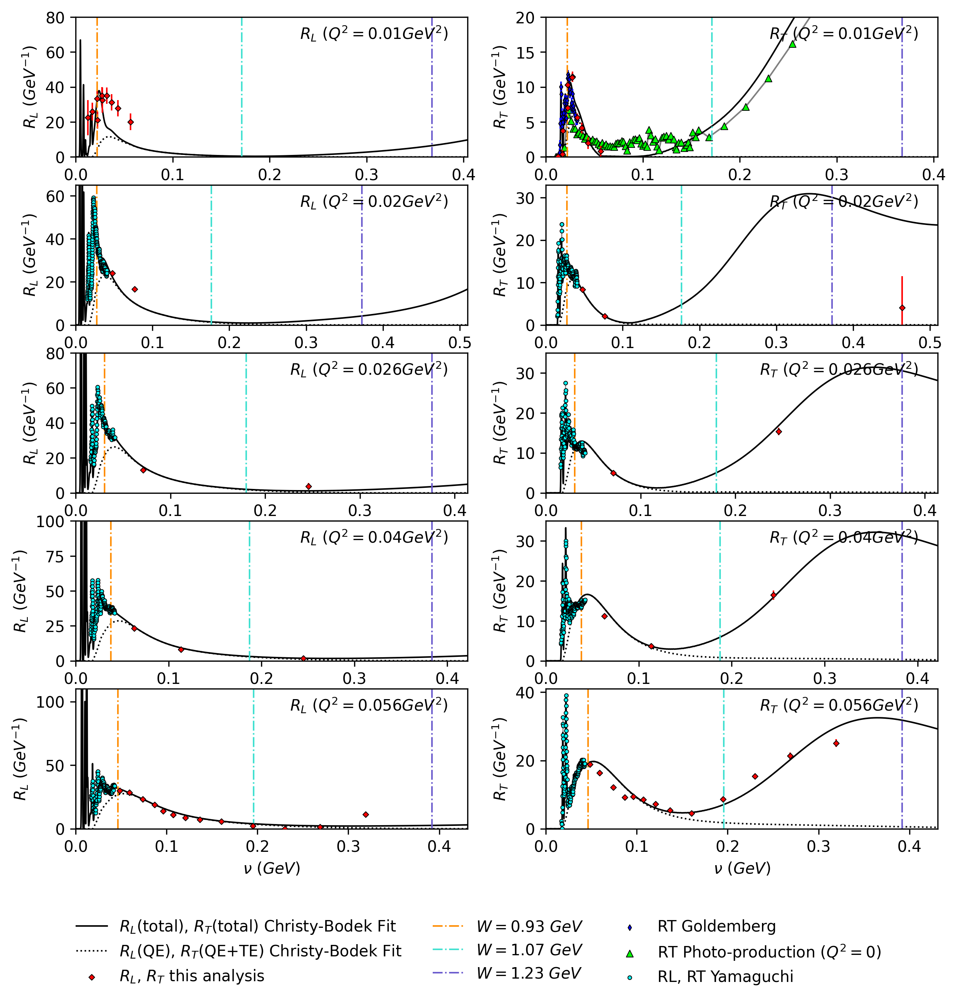

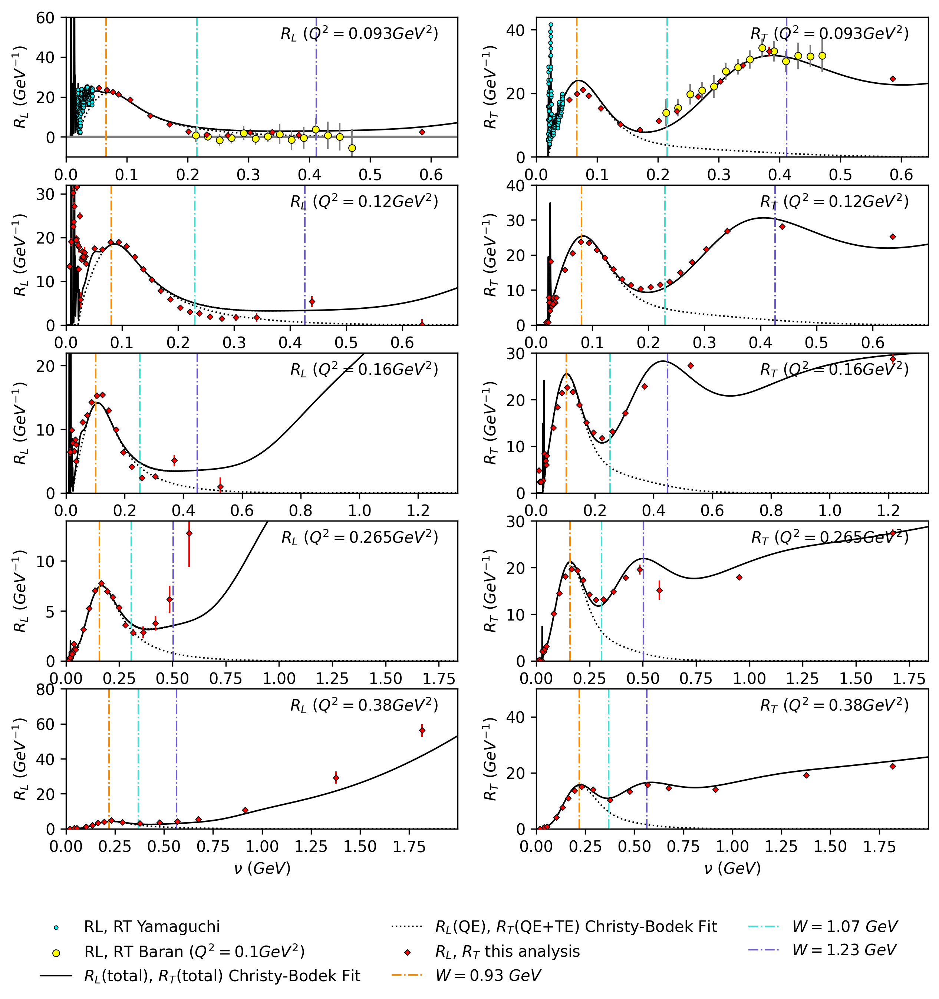

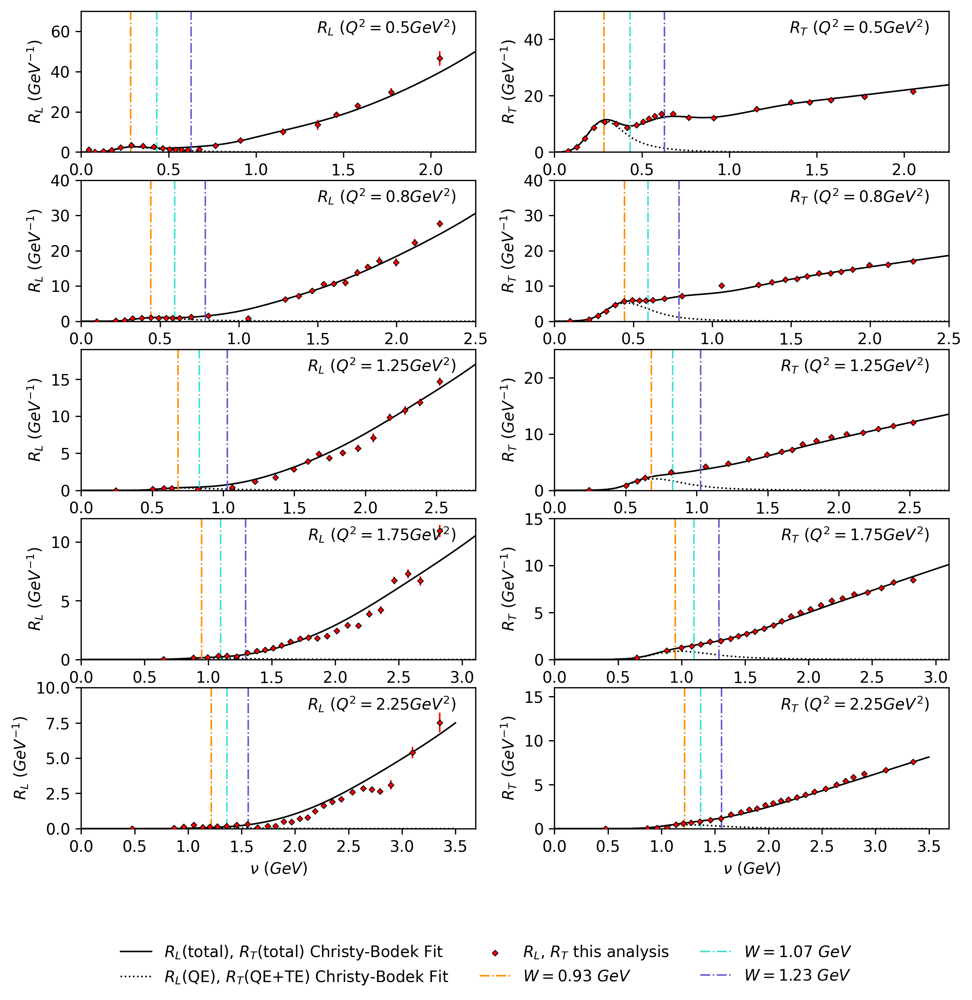

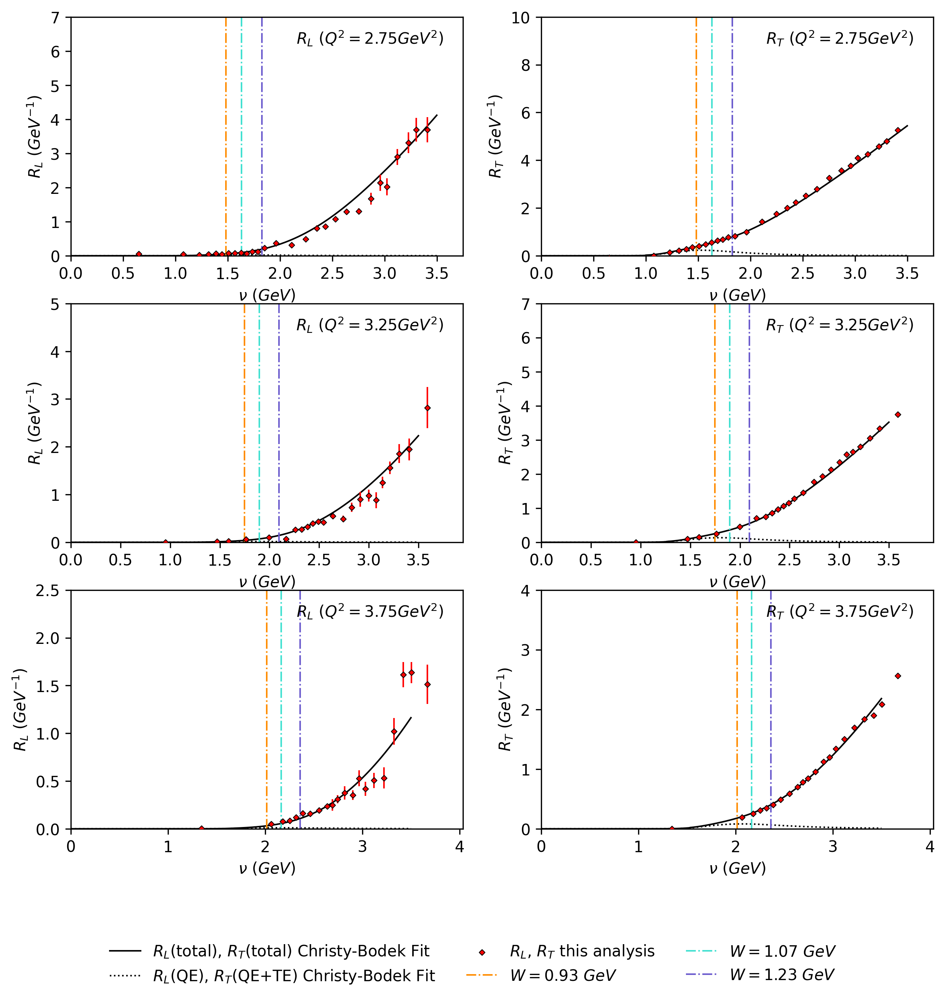

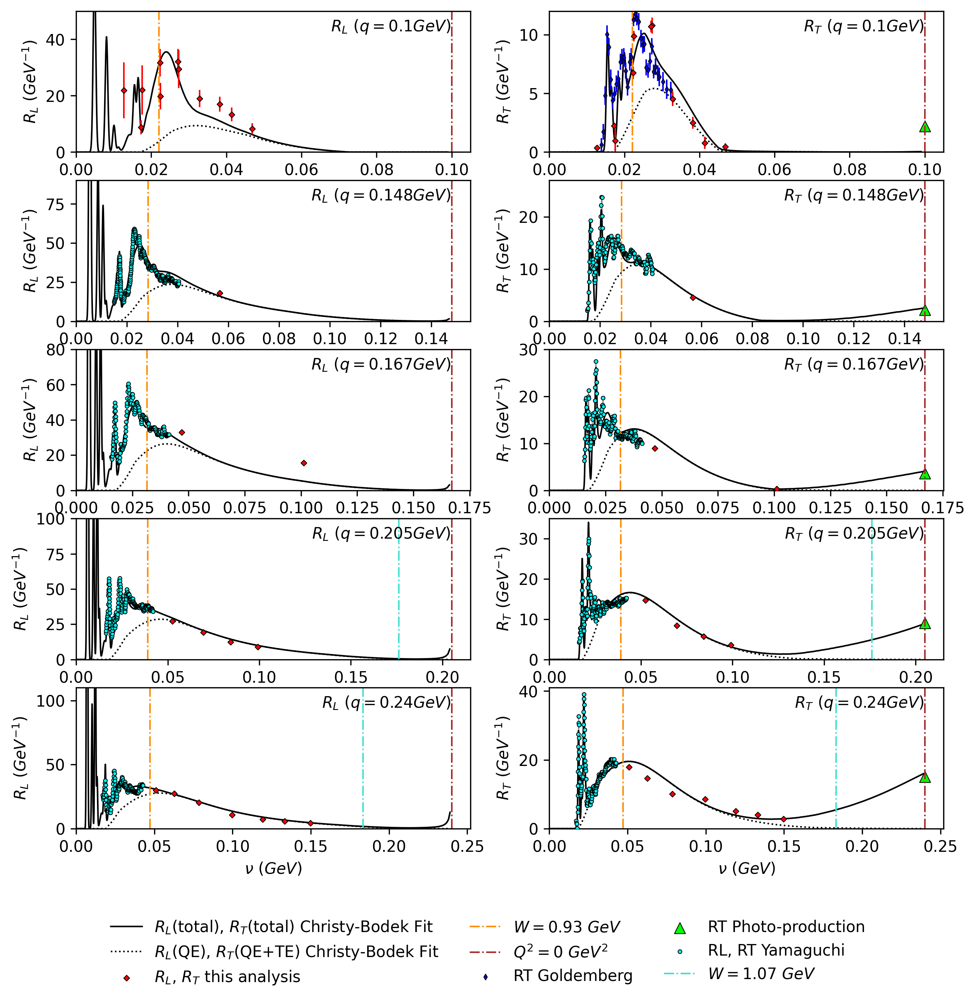

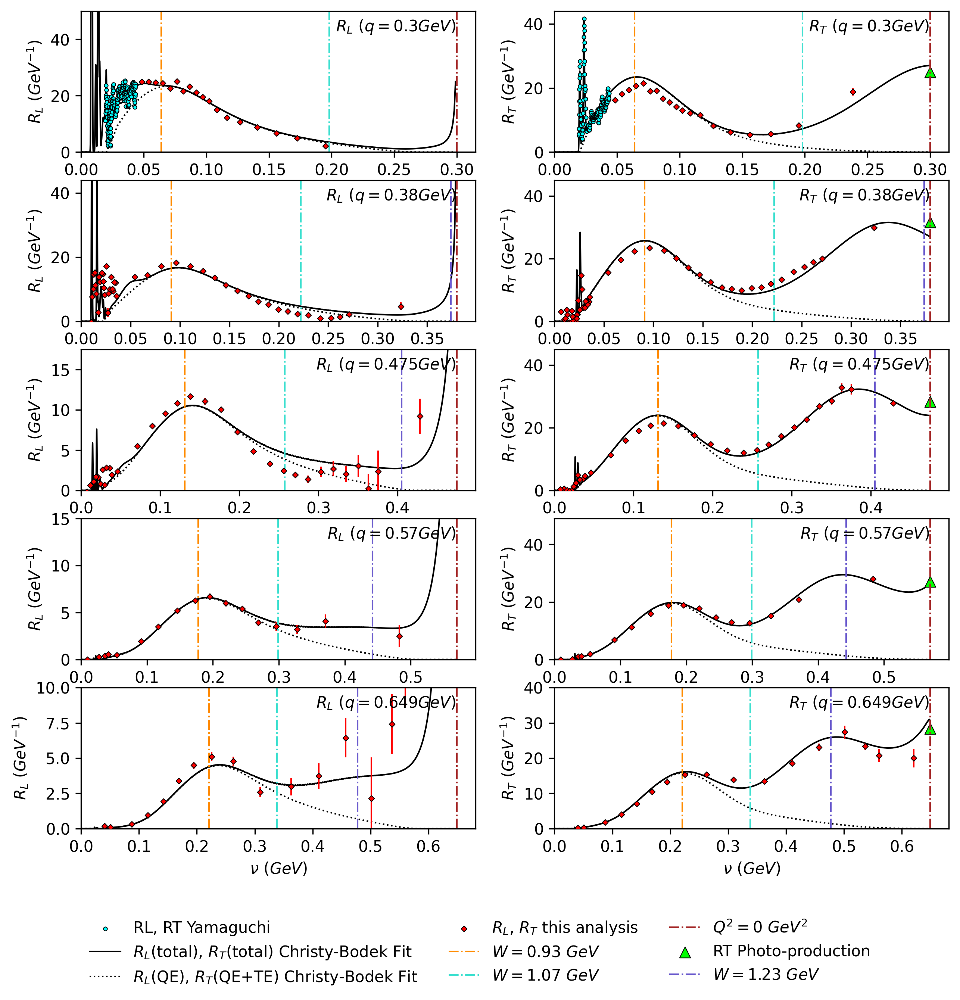

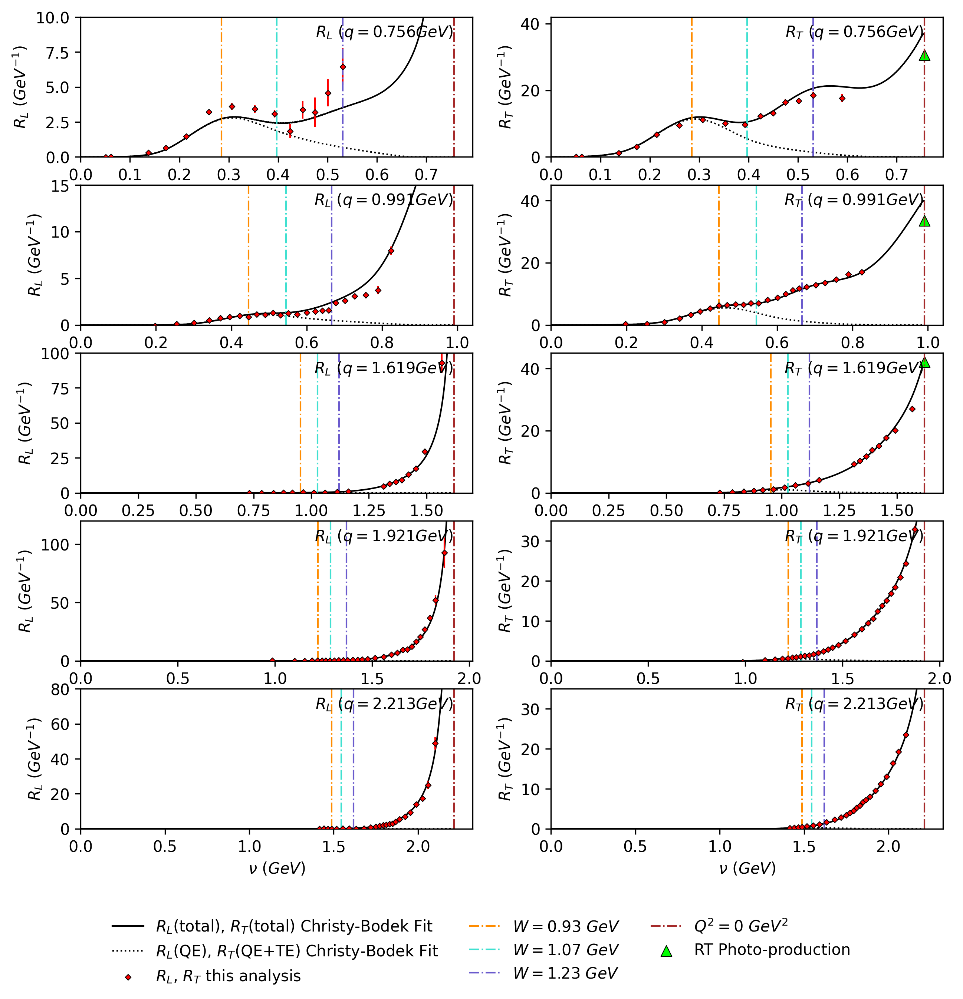

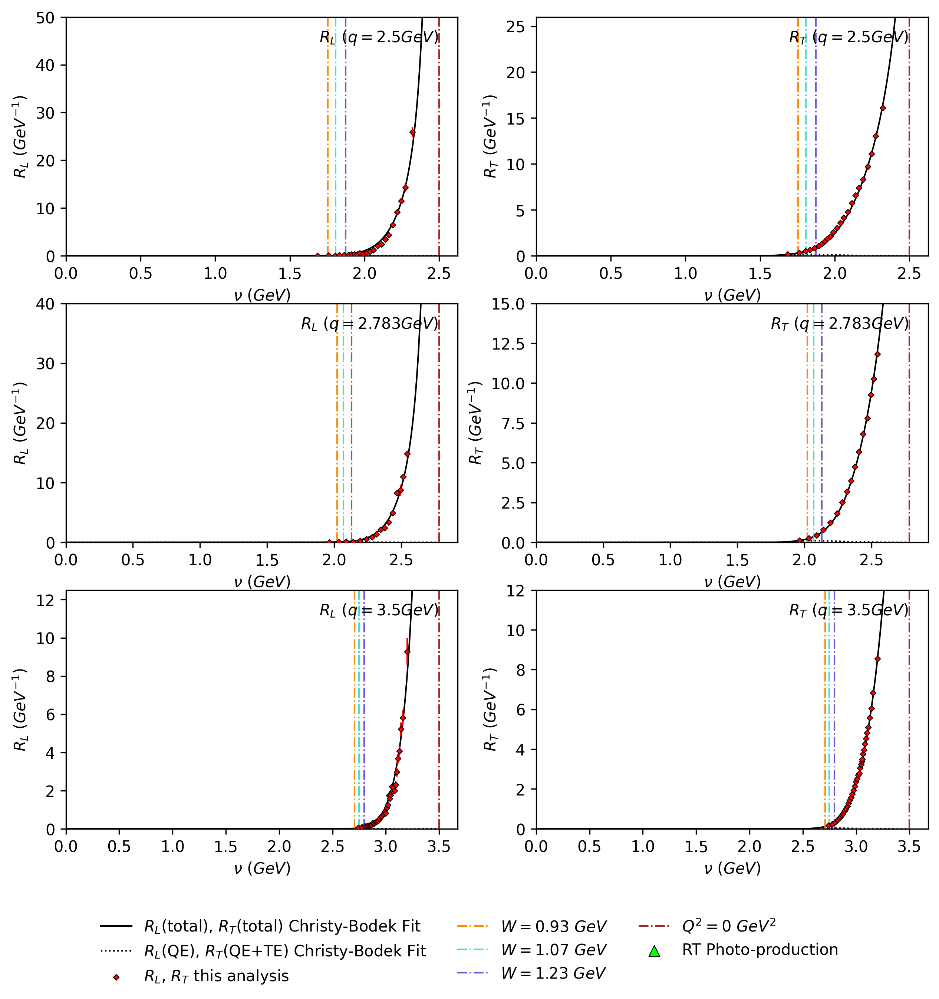

In [5]:
# plot Q2bins, qvbins: df

with PdfPages('12C_plots/data_Q2bin.pdf') as pdf:
    plot_indeices = [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14],[15,16,17]]
    for bin_indices in plot_indeices:
        fig = RLRT_plot_Q2bin(df=df,bin_indices=bin_indices)
        pdf.savefig(fig)


with PdfPages('12C_plots/data_qvbin.pdf') as pdf:
    plot_indeices = [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14],[15,16,17]]
    for bin_indices in plot_indeices:
        fig = RLRT_plot_qvbin(df=df,bin_indices=bin_indices)
        pdf.savefig(fig)

## print W2center, Excenter length
# for Q2center in Q2centers:
#     print(Q2center,'Ex len:',len(df.loc[(df['Q2center'] == Q2center) & (df['Ex'] < Ex_cut),'Ex']),
#           'W2 len:',len(df.loc[(df['Q2center'] == Q2center) & (df['Ex'] >= Ex_cut),'W2']))
# print()
# for qvcenter in qvcenters:
#     print(qvcenter,'Ex len:',len(df.loc[(df['qvcenter'] == qvcenter) & (df['Ex'] < Ex_cut),'Ex']),
#           'W2 len:',len(df.loc[(df['qvcenter'] == qvcenter) & (df['Ex'] >= Ex_cut),'W2']))


In [6]:
# df_CB 12C fake data

qemodplot_columns = ['e','nu','ep','theta','nu-nuel','w2','q2','sigtot','sigqe','sigie','sigmec','nuccstot','signonuc']
# df.loc[df['Ex']>0.05]
pd.read_csv('12C_data_raw/12C-25June11.csv')[['E0','ThetaDeg','nu']].to_csv('input.txt',index=False,header=False,sep=' ')
with open('output.txt', 'w') as output_file:
    subprocess.run(['Eric/cscompqe-25June10/qemodplot_norm', 'input.txt'], stdout=output_file) 
subprocess.run(['sleep', '0.5'])
df_CB = pd.read_csv('output.txt', sep='\s+', header=None, names=qemodplot_columns)
df_CB['cross']=df_CB['sigtot']*12*1e3
df_CB['E0']=df_CB['e']
df_CB['ThetaDeg']=df_CB['theta']
df_CB['A']=12
df_CB['Z']=6
df_CB=df_CB[['A','Z','E0','nu','ThetaDeg','cross']]
df_CB = prepare_df(df_data=df_CB,coulomb=0.0)
df_CB = calculate_bc(df_CB)
df_CB

RL RT bc_q2_w2 done.
RL RT bc_q2_ex done.
RL RT bc_qv_w2 done.
RL RT bc_q2_ex done.


,A,Z,E0,nu,ThetaDeg,cross,error,dataSet,normalization,normError,...,RL_qvc_w2,RT_qvc_w2,RL_qvd_w2,RT_qvd_w2,bc_qv_w2,RL_qvc_ex,RT_qvc_ex,RL_qvd_ex,RT_qvd_ex,bc_qv_ex
0,12,6,0.1196,0.00710,90.0,141.843240,0.0,-1,1,0,...,0.000000,0.000000,0.067601,3.425115e-06,1.000000,0.044276,1.684530e-04,0.067893,3.125043e-06,0.655017
1,12,6,0.1196,0.01210,90.0,13697.976000,0.0,-1,1,0,...,0.000000,0.000000,0.027170,9.867213e-04,1.000000,0.044276,1.684530e-04,0.027840,9.043287e-04,1.526488
2,12,6,0.1196,0.01710,90.0,36572.412000,0.0,-1,1,0,...,0.000000,0.000000,0.019829,8.019052e-03,1.000000,0.018909,7.127865e-03,0.019674,7.804702e-03,0.943007
3,12,6,0.1196,0.02210,90.0,34300.956000,0.0,-1,1,0,...,0.000000,0.000000,0.034280,1.320338e-02,1.000000,0.033817,1.255326e-02,0.033377,1.305634e-02,0.993573
4,12,6,0.1196,0.00210,145.0,0.002093,0.0,-1,1,0,...,0.000000,0.000000,0.013673,2.723063e-09,1.000000,0.084943,1.192114e-07,0.013717,2.730976e-09,6.188102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10366,12,6,0.7795,0.29939,50.4,1948.359600,0.0,-1,1,0,...,0.004417,0.011808,0.003843,1.174165e-02,1.025409,0.000004,2.583892e-12,0.003949,1.174557e-02,1.000000
10367,12,6,0.7795,0.30742,50.4,1919.274000,0.0,-1,1,0,...,0.003860,0.012570,0.003726,1.190963e-02,1.071624,0.000004,2.583892e-12,0.003812,1.174627e-02,1.000000
10368,12,6,0.7795,0.31582,50.4,1916.048400,0.0,-1,1,0,...,0.003860,0.012570,0.003619,1.228352e-02,1.038453,0.000004,2.583892e-12,0.003688,1.193841e-02,1.000000
10369,12,6,0.7795,0.32345,50.4,1936.966800,0.0,-1,1,0,...,0.003860,0.012570,0.003470,1.278893e-02,1.000799,0.000004,2.583892e-12,0.003619,1.227589e-02,1.000000


0.02 0.03347845389700214 0.9231800812756038
0.02 0.03881858768537552 0.9332010879756407
0.02 0.04643484094103341 0.9474933375575325
0.02 0.057453288211463796 0.9681699607090696
0.02 0.08093910220261073 1.0122421710109004
0.02 0.46372199456672497 1.7305518765452095
0.02 0.03137489075998745 0.9192326482850914
0.02 0.03475331139170046 0.92557241000785
0.02 0.03616803359557224 0.9282272013006367
0.02 0.03760910753319696 0.9309314428339907
0.02 0.04010443372251168 0.9356140372132444
0.026 0.05979466957869173 0.9665636705482157
0.026 0.03128866990444069 0.9130708508834986
0.026 0.11460874681972975 1.0694248079385766
0.026 0.036388870723775654 0.9226416123302184
0.026 0.27996460659398603 1.3797226851745181
0.026 0.6056506530741169 1.9908875329526219
0.04 0.03935702352396617 0.9142114875948046
0.04 0.06169453814446769 0.9561288613058483
0.04 0.10983767598068002 1.0464716740398412
0.04 0.034592998528612015 0.9052715755458728
0.04 0.24096025867321702 1.2925292321011908
0.04 0.5513647078795253 1.

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b

0.056 0.03314095118956762 0.8865467419199784
0.056 0.043370966258160865 0.9057438357768868
0.056 0.04912388484175691 0.9165394521332596
0.056 0.06125015238976787 0.9392949509954094
0.056 0.07476731121603265 0.9646605213222013
0.056 0.08524041774132622 0.9843137874798148
0.056 0.09388283169329423 1.0005316748117246
0.056 0.10421849856650793 1.0199270291399862
0.056 0.1171692461775937 1.0442297027665788
0.056 0.1333095909757271 1.0745178022361368
0.056 0.15809971759686192 1.121037615186521
0.056 0.19229190723358044 1.1852008318805465
0.056 0.2258048443523868 1.248089399979094
0.056 0.039599055023242236 0.8986656708366452
0.056 0.26423109641317577 1.3201980295787594
0.056 0.31484197019906635 1.4151716623381771
0.056 0.5491394528607884 1.854841666237101
0.093 0.05497026225704701 0.8905104482864126
0.093 0.06707719829993324 0.9132296706899465
0.093 0.07640146875123205 0.9307270931082495
0.093 0.08536634897483744 0.9475501032323354
0.093 0.11122418687972696 0.9960735255214042
0.093 0.0385127

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:503: RuntimeWarning: invalid value encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_

0.12 0.037370652947556114 0.8304839718351247
0.12 0.051913947306563374 0.8577751326913423
0.12 0.0652281152742713 0.8827597813344727
0.12 0.0800218368850397 0.9105208804482737
0.12 0.09460427852228619 0.9378855029728821
0.12 0.1084997471578204 0.9639609890590193
0.12 0.12344908171637901 0.9920141030275442
0.12 0.13883133106395698 1.0208796015117443
0.12 0.15427709495736794 1.049864287962869
0.12 0.17023427843629899 1.0798086767915231
0.12 0.18701827743326804 1.1113046229732895
0.12 0.20476740185988473 1.1446116714195593
0.12 0.22114000848542528 1.175335620892291
0.12 0.23724537717453895 1.2055580860843724
0.12 0.2562770812925357 1.2412719543201827
0.12 0.27809440838739585 1.2822131722107342
0.12 0.3404169137081238 1.399164220280325
0.12 0.4377083031923897 1.581735988051466
0.12 0.3039276217917088 1.330690385491744
0.12 0.6353283183770289 1.95257903706614
0.16 0.03448648609173112 0.7850717000584937
0.16 0.058662408532402927 0.8304389306108466
0.16 0.07462310156922994 0.8603899052863322


/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b

0.5 0.08240260753747004 0.5349885060930093
0.5 0.13223365454105127 0.6284987580233916
0.5 0.18136253342392478 0.7206913591755324
0.5 0.23282118135688876 0.8172558791195442
0.5 0.2941628437113038 0.9323663302440723
0.5 0.359258861617433 1.0545220022617474
0.5 0.4206421362532079 1.1697105407464123
0.5 0.47339618741837225 1.2687059444441968
0.5 0.5082869911385105 1.3341801426020075
0.5 0.5407654619775789 1.3951274871411778
0.5 0.5748298860739651 1.459050945921555
0.5 0.6112512501411356 1.5273973109763475
0.5 0.6736079794295058 1.6444125818955215
0.5 0.7650919298974797 1.816086423210396
0.5 0.9144435672978642 2.096351640967538
0.5 1.1595933246877377 2.5563864375984755
0.5 1.35868456931948 2.929990316347193
0.5 1.475894816415863 3.149940736694922
0.5 1.5941119128286554 3.371780556099962
0.5 1.775831847523919 3.7127863726726202
0.5 2.0519470663326045 4.2309292820671835
0.8 0.2189381529163621 0.49120373763158764
0.8 0.27746056298041705 0.6010237321476497
0.8 0.32966316617338765 0.698984318359

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:567: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b

2.75 1.6214108392145468 1.1730082472137007
2.75 1.6823127489195533 1.2872934822629922
2.75 1.0654149536893645 0.12965639221496228
2.75 1.2314885679427265 0.4413011687476522
2.75 1.316797974556564 0.6013881944912224
2.75 1.3853564443230666 0.7300413166976735
2.75 1.4437301291775875 0.8395822215166852
2.75 1.50368749372618 0.9520949741308884
2.75 1.5640723325309513 1.065409901850627
2.75 1.7355768471167892 1.3872460126786224
2.75 1.7903146925724778 1.4899640976171131
2.75 1.8543692399593843 1.610165402297823
2.75 1.9659217732660885 1.8194988624643855
2.75 2.114970989695318 2.0991965733577906
2.75 2.259196387705778 2.369842167092727
2.75 2.518669375682575 2.8567551647886336
2.75 2.6245435308369154 3.0554328871468908
2.75 2.752407970725539 3.2953763903621276
2.75 2.364912778513188 2.5682238373968094
2.75 2.432478588797781 2.6950141884231202
2.75 2.868920806756811 3.514018086765267
2.75 2.9542226131810527 3.674090850403452
2.75 3.0373411619315296 3.830066630586964
2.75 3.143824143753276 4.0

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: invalid value encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_

W2c, nuc, len: 0.9242 0.03746 18
W2c, nuc, len: 0.9877 0.0695 85
W2c, nuc, len: 1.056 0.1027 18
W2c, nuc, len: 0.9038 0.03427 15
W2c, nuc, len: 0.9075 0.03616 15
W2c, nuc, len: 0.9099 0.03738 15
W2c, nuc, len: 0.912 0.03845 15
W2c, nuc, len: 0.9142 0.0396 15
W2c, nuc, len: 0.9169 0.04098 15
W2c, nuc, len: 0.9201 0.04263 15
W2c, nuc, len: 0.9389 0.05216 15
W2c, nuc, len: 0.9718 0.06862 15
W2c, nuc, len: 1.0 0.08257 15
W2c, nuc, len: 1.032 0.098 15
W2c, nuc, len: 0.8846 0.03239 23
W2c, nuc, len: 0.8921 0.03623 20
W2c, nuc, len: 0.8946 0.03755 21
W2c, nuc, len: 0.8976 0.03908 22
W2c, nuc, len: 0.9008 0.0407 21
W2c, nuc, len: 0.9035 0.04207 21
W2c, nuc, len: 0.906 0.04337 22
W2c, nuc, len: 0.9147 0.0478 20
W2c, nuc, len: 0.9348 0.0579 21
W2c, nuc, len: 0.9651 0.07301 22
W2c, nuc, len: 0.999 0.08965 21
W2c, nuc, len: 1.031 0.105 21
W2c, nuc, len: 1.062 0.1198 21
W2c, nuc, len: 1.092 0.1338 22
W2c, nuc, len: 1.128 0.1506 21


/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:863: RuntimeWarning: invalid value encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_

W2c, nuc, len: 0.8488 0.03062 23
W2c, nuc, len: 0.8607 0.03678 22
W2c, nuc, len: 0.8651 0.03901 22
W2c, nuc, len: 0.8692 0.04113 23
W2c, nuc, len: 0.8734 0.04326 22
W2c, nuc, len: 0.8777 0.04542 22
W2c, nuc, len: 0.8851 0.04918 23
W2c, nuc, len: 0.8962 0.05478 22
W2c, nuc, len: 0.9071 0.06027 22
W2c, nuc, len: 0.9176 0.06552 23
W2c, nuc, len: 0.9283 0.07081 22
W2c, nuc, len: 0.9388 0.07604 22
W2c, nuc, len: 0.9494 0.08121 23
W2c, nuc, len: 0.9595 0.08616 22
W2c, nuc, len: 0.9698 0.0912 22
W2c, nuc, len: 0.9801 0.09618 23
W2c, nuc, len: 0.9906 0.1013 22
W2c, nuc, len: 1.006 0.1084 22
W2c, nuc, len: 1.026 0.1181 23
W2c, nuc, len: 1.051 0.1299 22
W2c, nuc, len: 1.082 0.1441 22
W2c, nuc, len: 1.116 0.1601 23
W2c, nuc, len: 1.155 0.1774 22
W2c, nuc, len: 1.201 0.1978 22
W2c, nuc, len: 1.295 0.2387 23
W2c, nuc, len: 0.8075 0.03737 23
W2c, nuc, len: 0.8441 0.05597 22
W2c, nuc, len: 0.872 0.0699 23
W2c, nuc, len: 0.9006 0.08396 22
W2c, nuc, len: 0.931 0.09874 23
W2c, nuc, len: 0.9617 0.1135 22

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b

W2c, nuc, len: 0.09415 1.58 19
W2c, nuc, len: 0.6177 1.682 18
W2c, nuc, len: 1.018 1.758 19
W2c, nuc, len: 1.27 1.804 18
W2c, nuc, len: 1.43 1.833 18
W2c, nuc, len: 1.61 1.865 17
W2c, nuc, len: 1.77 1.894 18
W2c, nuc, len: 1.89 1.915 18
W2c, nuc, len: 2.01 1.936 18
W2c, nuc, len: 2.11 1.953 18
W2c, nuc, len: 2.21 1.97 18
W2c, nuc, len: 2.33 1.991 18
W2c, nuc, len: 2.47 2.015 18
W2c, nuc, len: 2.61 2.038 18
W2c, nuc, len: 2.75 2.062 18
W2c, nuc, len: 2.91 2.088 18
W2c, nuc, len: 3.07 2.115 18
W2c, nuc, len: 3.23 2.141 18
W2c, nuc, len: 3.37 2.163 18
W2c, nuc, len: 3.53 2.189 18
W2c, nuc, len: 3.73 2.221 19
W2c, nuc, len: 3.89 2.246 17
W2c, nuc, len: 4.07 2.274 17
W2c, nuc, len: 4.37 2.321 19
W2c, nuc, len: 0.6793 1.964 21
W2c, nuc, len: 1.093 2.035 21
W2c, nuc, len: 1.43 2.091 21
W2c, nuc, len: 1.748 2.143 21
W2c, nuc, len: 2.07 2.195 21
W2c, nuc, len: 2.374 2.243 21
W2c, nuc, len: 2.632 2.283 21
W2c, nuc, len: 2.865 2.319 21
W2c, nuc, len: 3.062 2.349 21
W2c, nuc, len: 3.247 2.377 21
W

/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
/var/folders/74/13k54tvs74vchflrfsmkcc_m0000gn/T/ipykernel_67020/1424905648.py:964: RuntimeWarning: divide by zero encountered in divide
  Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))


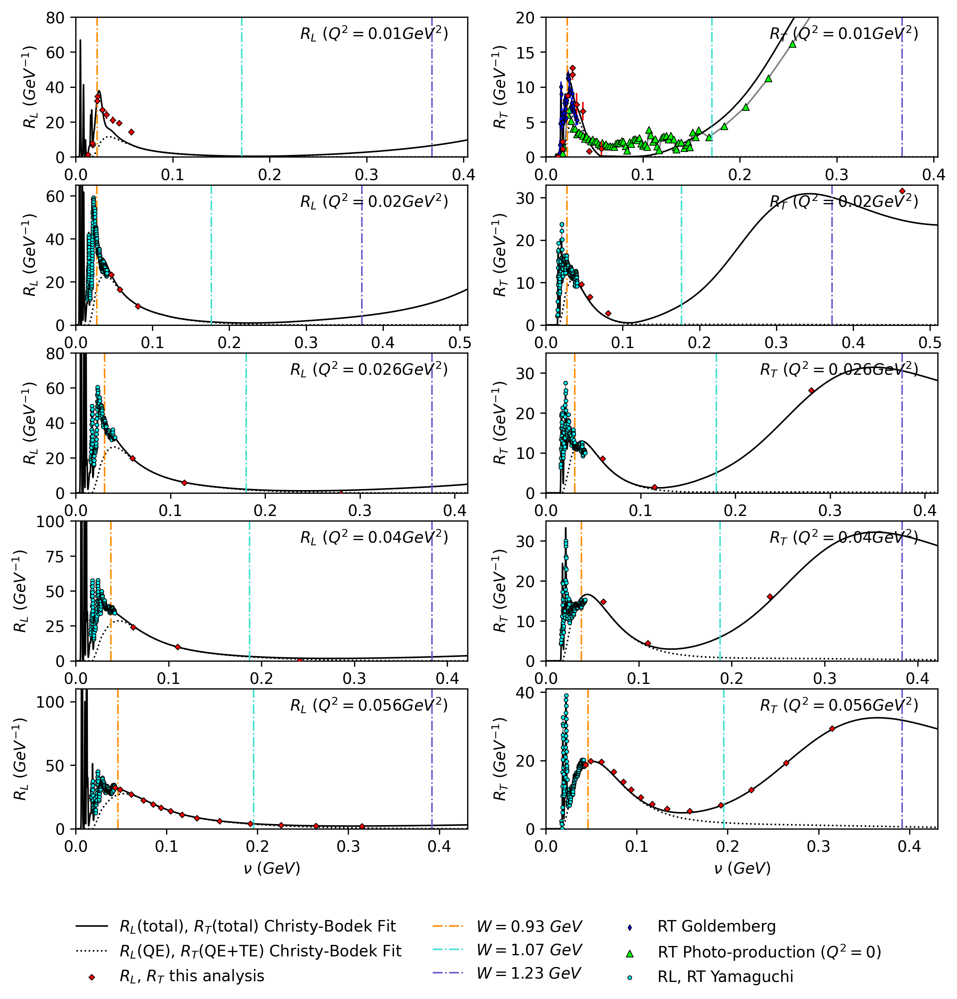

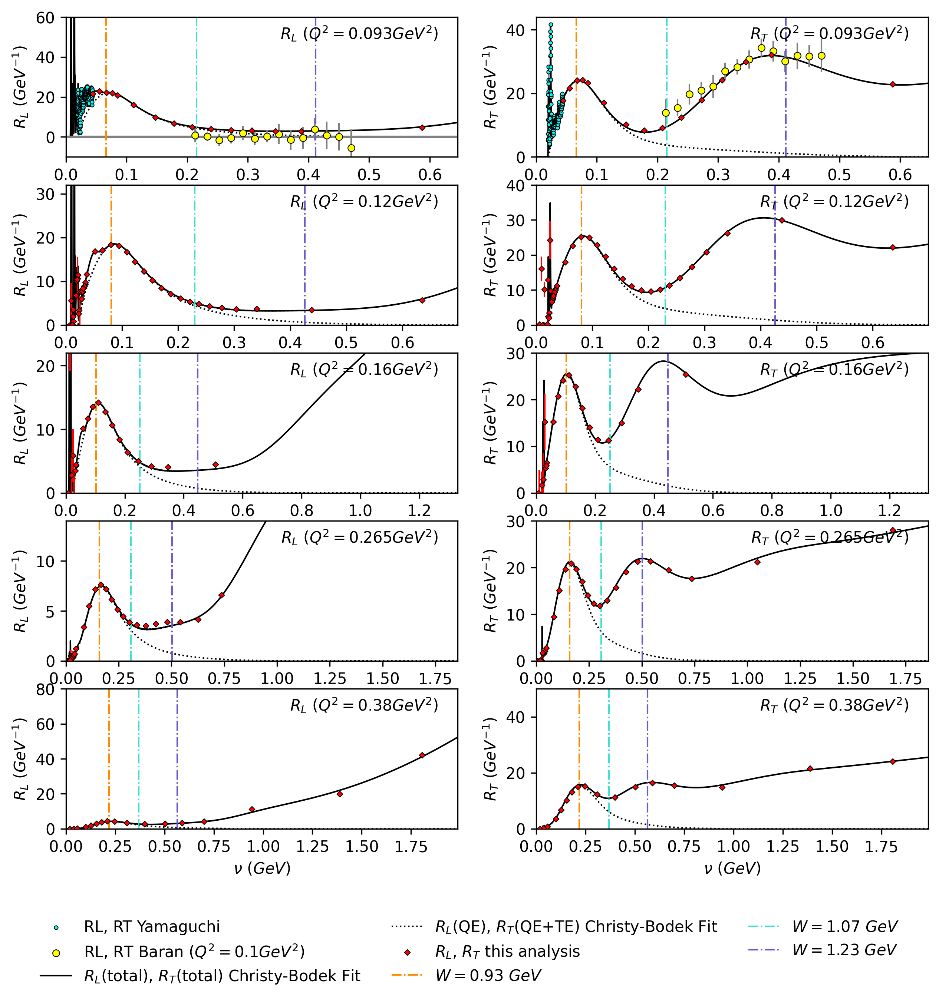

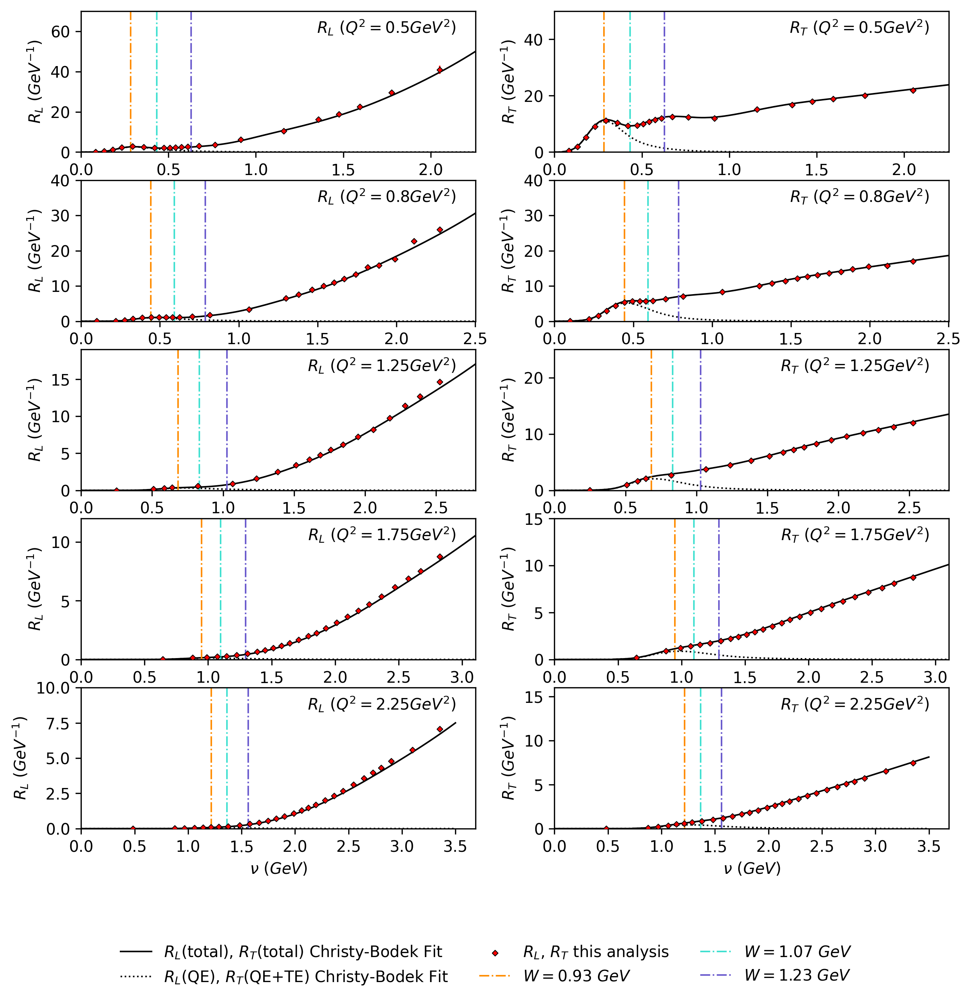

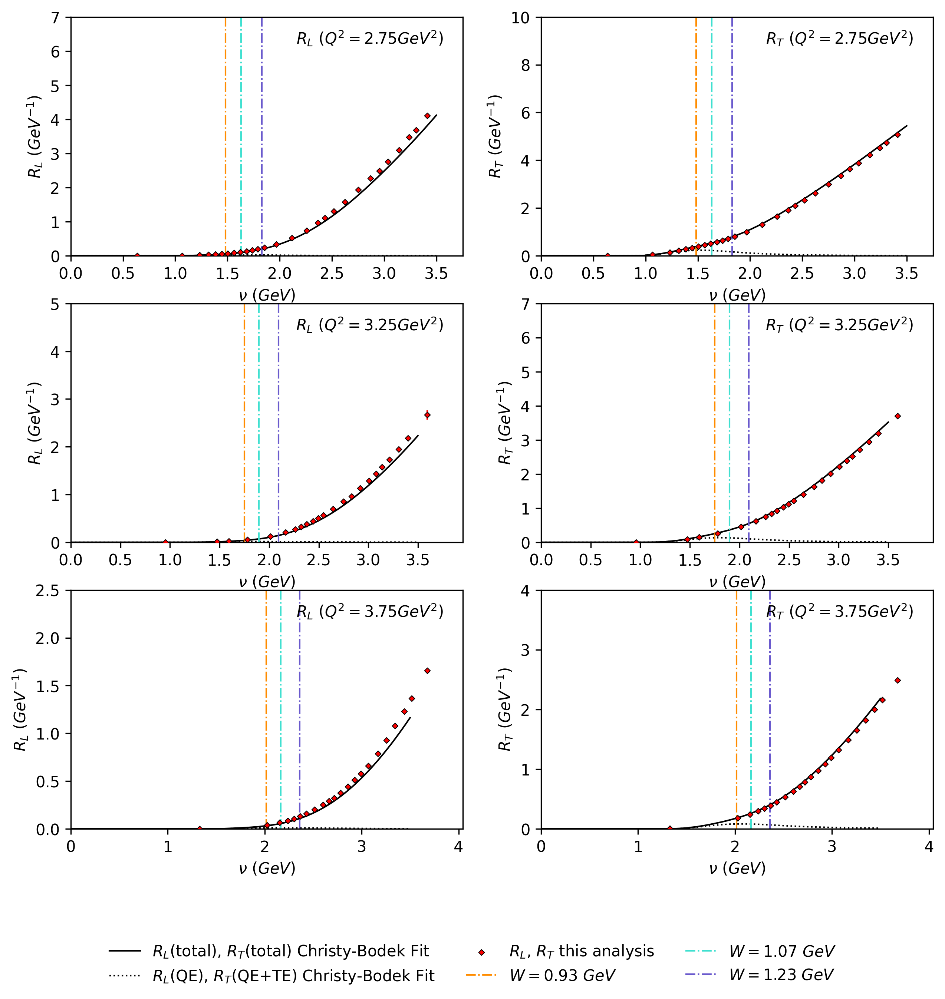

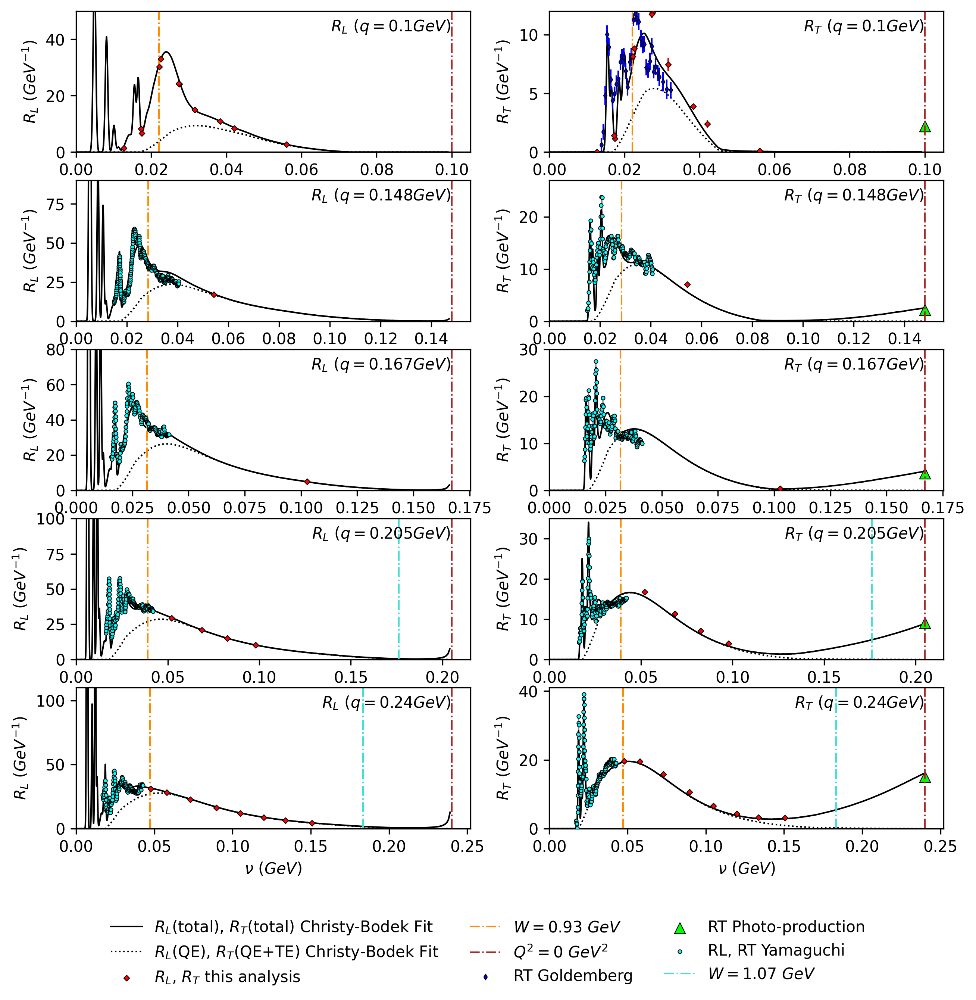

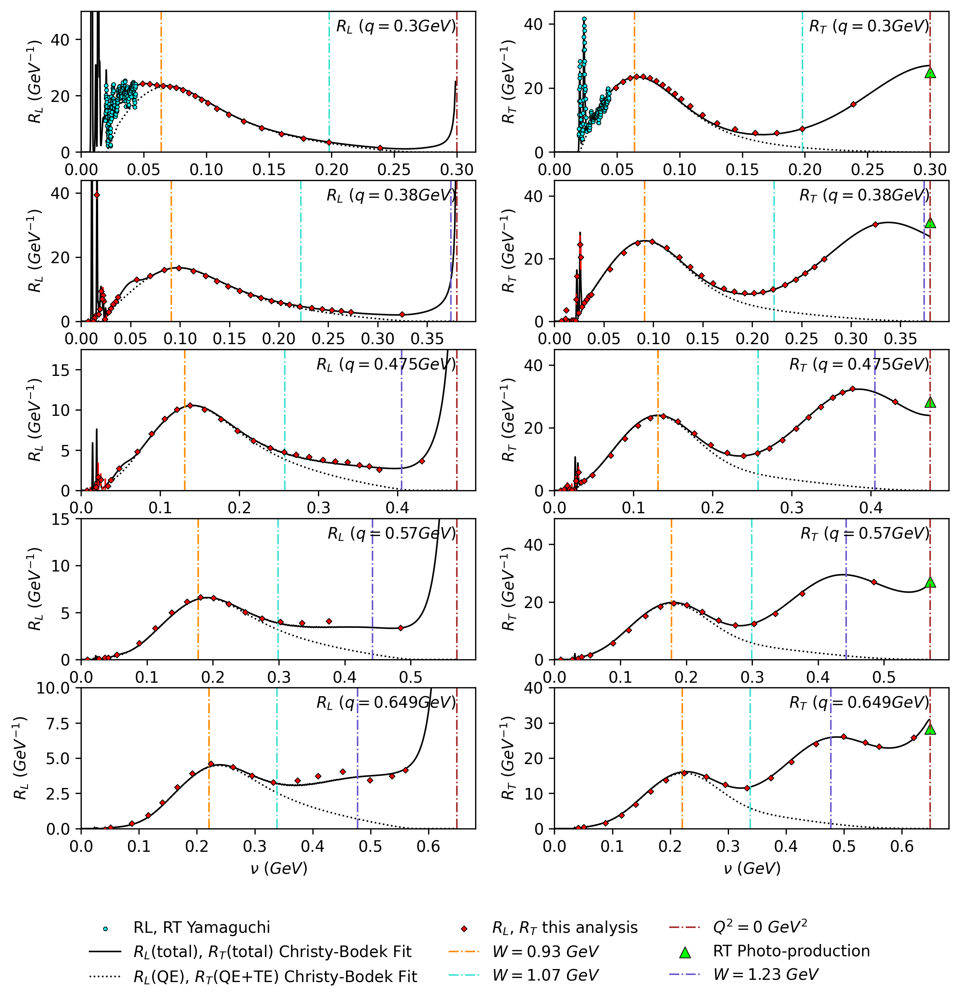

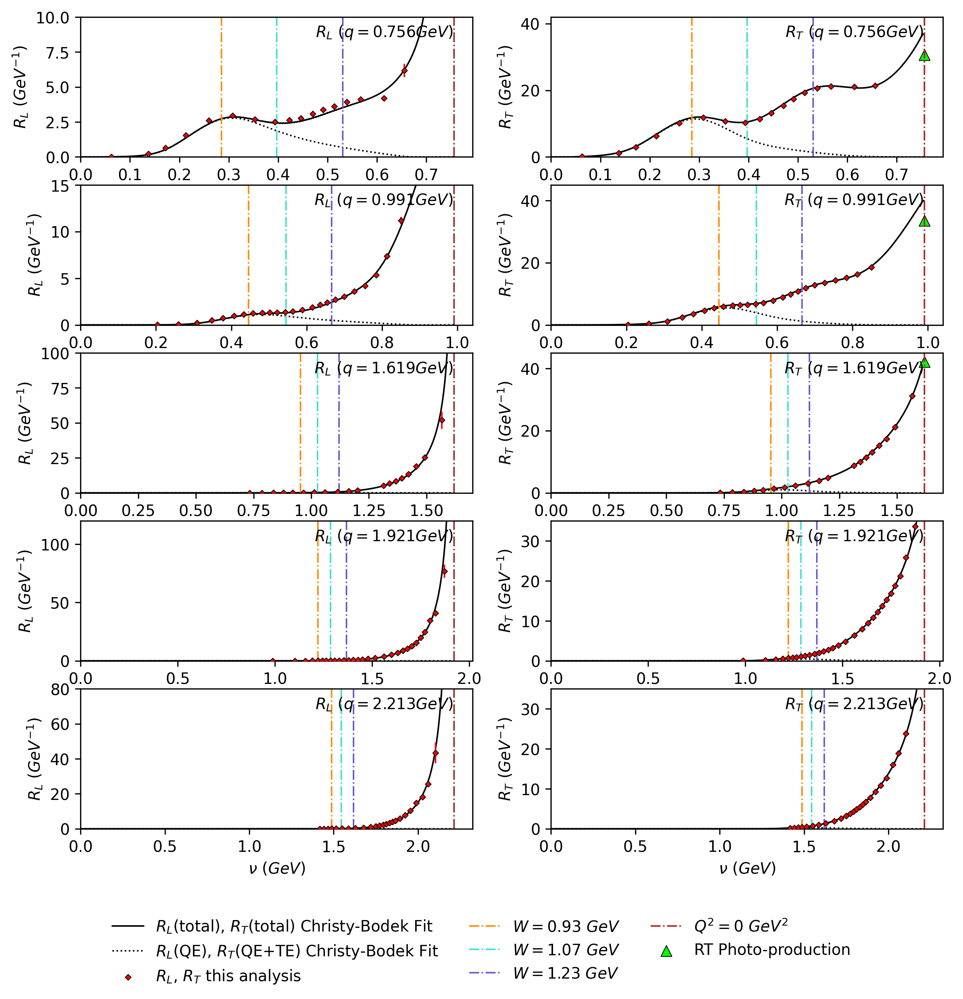

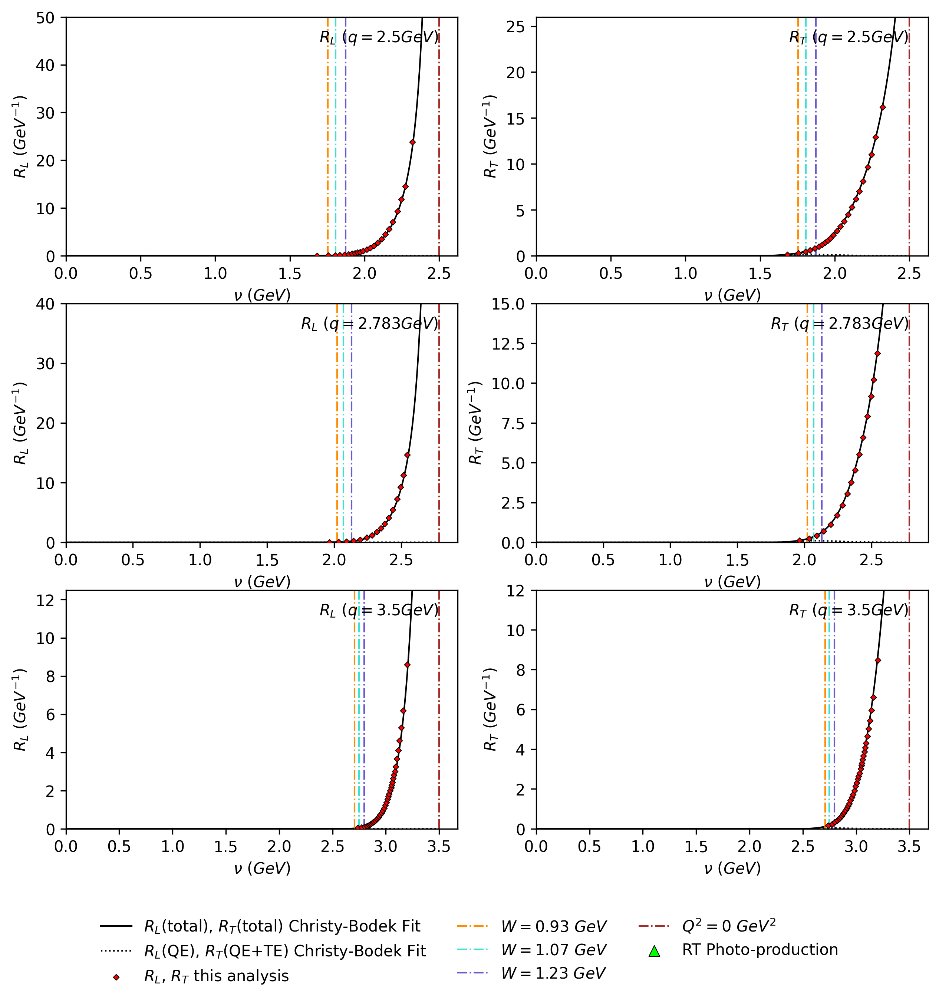

In [7]:
# plot Q2bins, qvbins: df_CB

with PdfPages('12C_plots/CBfit_Q2bin.pdf') as pdf:
    plot_indeices = [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14],[15,16,17]]
    for bin_indices in plot_indeices:
        fig=RLRT_plot_Q2bin(df=df_CB,bin_indices=bin_indices,absolute_sigma=False,bc=True)
        pdf.savefig(fig)

with PdfPages('12C_plots/CBfit_qvbin.pdf') as pdf:
    plot_indeices = [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14],[15,16,17]]
    for bin_indices in plot_indeices:
        fig=RLRT_plot_qvbin(df=df_CB,bin_indices=bin_indices,absolute_sigma=False,bc=True)
        pdf.savefig(fig)



In [8]:
# # (uncomment when use) calculate CB Q2edges, Qvedges; make sure you have the correct smwidth!
# def calculate_CB_Q2edges(Q2):
#     # df = pd.DataFrame({'nu':np.arange(0.0,3.5,0.001)})
#     df = pd.DataFrame({'nu':np.append(np.arange(0.0,0.0299,0.0001),np.arange(0.030,3.5,0.001))})
#     df['q2']=Q2
#     response_columns = ['qv','q2','ex','nu','RTTOT','RLTOT','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
#     df[['q2','nu']].to_csv('input.txt',index=True,header=False,sep=' ')
#     with open('output.txt', 'w') as output_file:
#         subprocess.run(['Eric/response-25June10/response_Q2edges', 'input.txt'], stdout=output_file) 
#     subprocess.run(['sleep', '0.5'])
#     df = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
#     df=df.dropna()
#     return df

# def calculate_CB_Qvedges(qv):
#     # df = pd.DataFrame({'nu':np.arange(0.0,qv,0.001)})
#     df = pd.DataFrame({'nu':np.append(np.arange(0.0,0.0299,0.0001),np.arange(0.030,qv,0.001))})
#     df['qv']=qv
#     response_columns = ['qv','q2','ex','nu','RTTOT','RLTOT','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
#     df[['qv','nu']].to_csv('input.txt',index=True,header=False,sep=' ')
#     with open('output.txt', 'w') as output_file:
#         subprocess.run(['Eric/response-25June10/response_Qvedges', 'input.txt'], stdout=output_file) 
#     subprocess.run(['sleep', '0.5'])
#     df = pd.read_csv('output.txt', sep='\s+', header=None, names=response_columns)
#     df=df.dropna()
#     return df

# for Q2 in Q2centers:
#     df_edges=calculate_CB_Q2edges(Q2)
#     df_edges.to_csv(f'Eric/ChristyBodekFit/Q2edges/Q2edge_{Q2}.csv',index=False)
# for Q2 in Q2bins:
#     df_edges=calculate_CB_Q2edges(Q2)
#     df_edges.to_csv(f'Eric/ChristyBodekFit/Q2edges/Q2edge_{Q2}.csv',index=False)

# for qv in qvcenters:
#     df_edges=calculate_CB_Qvedges(qv)
#     df_edges.to_csv(f'Eric/ChristyBodekFit/Qvedges/Qvedge_{qv}.csv',index=False)
# for qv in qvbins:
#     df_edges=calculate_CB_Qvedges(qv)
#     df_edges.to_csv(f'Eric/ChristyBodekFit/Qvedges/Qvedge_{qv}.csv',index=False)

In [ ]:
# # (uncomment when use) save extracted RLRT to file
# df_ours = pd.DataFrame()
# for i in range(len(qvcenters)):

#     qvcenter = qvcenters[i]
#     fit = pd.concat([RLRT_extract_q2_ex(df,bin_index=i,bc=True,absolute_sigma=True),
#                         RLRT_extract_q2_w2(df,bin_index=i,bc=True,absolute_sigma=True)])

#     if i in [1,2,3,4,5]:
#         # for Yama_qvcenter in [0.148,0.167,0.205,0.24,0.3]:
#         Yama_qvcenter  = qvcenters[i]
#         # Yamaguchi RL
#         Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))                  
#         fit = fit.loc[fit['nu']>Yam_data['nu_RL'].max()+0.002]

#     # append to DataFrame
#     df_ours = pd.concat([df_ours, fit], ignore_index=True)
# df_ours.to_csv('12C_plots/Q2bin_our_extraction.csv',index=False)


# df_ours = pd.DataFrame()
# for i in range(len(qvcenters)):

#     qvcenter = qvcenters[i]
#     fit = pd.concat([RLRT_extract_qv_ex(df,bin_index=i,bc=True,absolute_sigma=True),
#                         RLRT_extract_qv_w2(df,bin_index=i,bc=True,absolute_sigma=True)])

#     if i in [1,2,3,4,5]:
#         # for Yama_qvcenter in [0.148,0.167,0.205,0.24,0.3]:
#         Yama_qvcenter  = qvcenters[i]
#         # Yamaguchi RL
#         Yam_data = pd.read_excel('12C_other_extractions/Yamaguchi/Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))                  
#         fit = fit.loc[fit['nu']>Yam_data['nu_RL'].max()+0.002]

#     # append to DataFrame
#     df_ours = pd.concat([df_ours, fit], ignore_index=True)
# df_ours.to_csv('12C_plots/Qvbin_our_extraction.csv',index=False)



0.02 0.03271054160552656 0.9217390585366845
0.02 0.03784693132441261 0.9313777301181012
0.02 0.047532988138263156 0.9495540612879052
0.02 0.07648824595619821 1.00388993452512
0.02 0.4637147672779066 1.7305383142052866
0.02 0.0306922936179551 0.9179517233485992
0.02 0.03389777860165183 0.9239669633728154
0.02 0.03519797267108652 0.9264068373530367
0.02 0.036622618309372246 0.9290802504269793
0.02 0.039014553125620015 0.9335688261386698
0.02 0.04044768699548223 0.9362581677696242
0.026 0.07116986382521265 0.9879097458107475
0.026 0.037922302014804676 0.9255191666856737
0.026 0.2458280151811449 1.3156638011051167
0.026 0.5984024666122193 1.9772859776402938
0.04 0.03718236934407422 0.9101306489921451
0.04 0.06298030391439267 0.958541659918338
0.04 0.11333404595773683 1.0530327731348073
0.04 0.03383771274768109 0.90385424703481
0.04 0.04026359275277628 0.9159127064548513
0.04 0.24495610964207132 1.3000276302533904
0.04 0.5532038936403799 1.8784687763242804
0.056 0.03871561365750942 0.897007

In [10]:
# # (uncomment when use) check Rosenbluth plot
# # test q=0.756
# fit=RLRT_extract_qv_w2(df=df,bin_index=10,Rosenbluth_plot=True)

# fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(12,5))
# ax[0].scatter(fit['nu'],fit['RL'],**our_scatter_setting)
# ax[0].errorbar(fit['nu'],fit['RL'],yerr=fit['RLerr'],**errorbar_setting)
# ax[1].scatter(fit['nu'],fit['RT'],**our_scatter_setting)
# ax[1].errorbar(fit['nu'],fit['RT'],yerr=fit['RTerr'],**errorbar_setting)

# CBfit = pd.read_csv('Eric/ChristyBodekFit/Qvedges/Qvedge_0.756.csv')
# CBfit = CBfit.loc[CBfit['nu']<=0.6]
# ax[0].plot(CBfit['nu'],CBfit['RLTOT'])
# ax[1].plot(CBfit['nu'],CBfit['RTTOT'])

# # test q=0.1
# fit=RLRT_extract_qv_ex(df=df,bin_index=0,Rosenbluth_plot=True,bc=True)
# fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(12,5))
# ax[0].scatter(fit['nu'],fit['RL'],**our_scatter_setting)
# ax[0].errorbar(fit['nu'],fit['RL'],yerr=fit['RLerr'],**errorbar_setting)
# ax[1].scatter(fit['nu'],fit['RT'],**our_scatter_setting)
# ax[1].errorbar(fit['nu'],fit['RT'],yerr=fit['RTerr'],**errorbar_setting)

# CBfit = pd.read_csv('Eric/ChristyBodekFit/Qvedges/Qvedge_0.1.csv')
# ax[0].plot(CBfit['nu'],CBfit['RLTOT'])
# ax[1].plot(CBfit['nu'],CBfit['RTTOT'])


In [11]:
os.system('say done')

0